# Temperature Forecast Project using ML

#Problem Statement:

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.

The dataset contains two outtput attributes namely

1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature
    
Here we need predict both next day maximum and next day minimum air temperature. We will use Ragression ML algorithms to predict the temperature.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import os
import scipy as stats
from sklearn.utils import shuffle
%matplotlib inline
warnings.filterwarnings('ignore')

### Importing Dataset

In [2]:
# Reading the csv file from dataset
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Dataset2/main/temperature.csv")
pd.set_option("display.max_columns",None)
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


Here We have imported the dataset using pd.read_csv and set the option to display all the columns present in the dataset. The dataset contains the details of summer temperature data. In the dataset there are two target columns, one is **Next_Tmax** and **Next_Tmin**. Since both the output attributes are continuous in nature so it termed to be a **Regression Type** problem.

**Attribute Information:**

For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

# Exploratory Data Analysis (EDA)

In [3]:
df.shape

(7752, 25)

The dataset contains 7752 rows and 25 columns.

In [4]:
# Checking the value counts of each columns
for i in df.columns:
        print(df[i].value_counts())
        print('****************************************')

25.0    310
12.0    310
2.0     310
3.0     310
4.0     310
5.0     310
6.0     310
7.0     310
8.0     310
9.0     310
10.0    310
11.0    310
13.0    310
23.0    310
14.0    310
15.0    310
16.0    310
18.0    310
20.0    310
22.0    310
24.0    310
17.0    310
19.0    310
21.0    310
1.0     310
Name: station, dtype: int64
****************************************
09-08-2016    25
12-08-2016    25
24-08-2013    25
07-07-2015    25
29-08-2016    25
              ..
01-07-2014    25
27-08-2015    25
09-08-2014    25
30-06-2016    25
20-08-2017    25
Name: Date, Length: 310, dtype: int64
****************************************
31.4    112
29.4    111
29.1    108
29.7    107
30.6    105
       ... 
36.4      1
20.7      1
20.4      1
20.3      1
21.2      1
Name: Present_Tmax, Length: 167, dtype: int64
****************************************
24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
13.5      1
15.0      1
13.6      1
14.2      1
29.6      1
Name: Present_

These are the value counts of all the columns.

In [5]:
# Checking null values in the dataframe
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

There are several missing values present in many columns. We will use appropriate imputation methods to fill the null values.

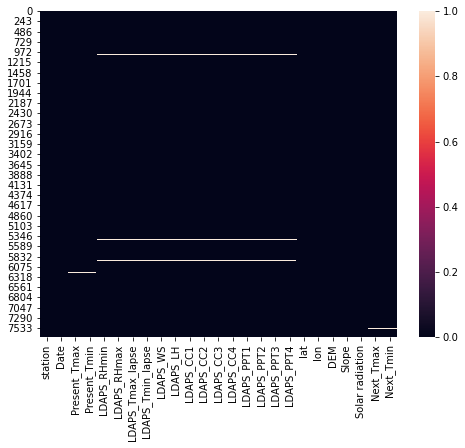

In [6]:
# Let's visualize the null values clearly
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull())
plt.show()

We can clearly observe the white lines in the heat map which indicates the missing values in the dataset.

## Treating null values

In [5]:
# Checking unique values in station column
df["station"].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., nan])

1. From the dataset we can notice that there are 25 stations and the data is collected from each of the stations every day stating from 1 and ends at 25th station and the process is repeating.
2. station column has missing values at the very last that is the null values in station column is present after 25, which means this data is collected from next day. So we will replace the null values in station by considering it as a next day.

In [6]:
# Filling null values in "station" column 
df['station'].iloc[7750] = 1.0
df['station'].iloc[7751] = 2.0

By observing the dataset we can infer that the Date column has null values at the very last, that means this data is also collected from next date. So we will replace the null values in Date column by next date i.e,31-08-2017.

In [7]:
# Filling null values in "Date" column by next date of 30-08-2017
df['Date'].iloc[7750] = '31-08-2017'
df['Date'].iloc[7751] = '31-08-2017'

Now we will use imputation methods to fill the null values in the remaining columns.

In [8]:
# Checking skewness 
df.skew()

station             0.000182
Present_Tmax       -0.262942
Present_Tmin       -0.365875
LDAPS_RHmin         0.298765
LDAPS_RHmax        -0.850870
LDAPS_Tmax_lapse   -0.226775
LDAPS_Tmin_lapse   -0.578943
LDAPS_WS            1.571581
LDAPS_LH            0.670491
LDAPS_CC1           0.457231
LDAPS_CC2           0.470060
LDAPS_CC3           0.637630
LDAPS_CC4           0.663251
LDAPS_PPT1          5.367675
LDAPS_PPT2          5.747360
LDAPS_PPT3          6.425829
LDAPS_PPT4          6.792379
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.339607
Next_Tmin          -0.403743
dtype: float64

- The columns LDAPS_RHmax, LDAPS_Tmin_lapse, LDAPS_WS, LDAPS_LH, LDAPS_CC3, LDAPS_CC4, LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3 and LDAPS_PPT4 have skewness which means the data is not symmetric also the outliers present in those columns. So we will use median method to fill the null values in htose columns.
- For the remaining columns we will use mean value to fill the null values.

In [9]:
# Checking mean values of the columns.
print("The mean of Present_Tmax is:",df["Present_Tmax"].mean())  # we will fill the null values using its mean values
print("The mean of Present_Tmin is:",df["Present_Tmin"].mean())
print("The mean of LDAPS_RHmin is:",df["LDAPS_RHmin"].mean())
print("The mean of LDAPS_Tmax_lapse  is:",df["LDAPS_Tmax_lapse"].mean())
print("The mean of LDAPS_CC1  is:",df["LDAPS_CC1"].mean())
print("The mean of LDAPS_CC2 is:",df["LDAPS_CC2"].mean())
print("The mean of Next_Tmax is:",df["Next_Tmax"].mean())
print("The mean of Next_Tmin is:",df["Next_Tmin"].mean())

The mean of Present_Tmax is: 29.76821140328037
The mean of Present_Tmin is: 23.22505857849521
The mean of LDAPS_RHmin is: 56.75937215069287
The mean of LDAPS_Tmax_lapse  is: 29.613446542813577
The mean of LDAPS_CC1  is: 0.36877358559828194
The mean of LDAPS_CC2 is: 0.35608043728396527
The mean of Next_Tmax is: 30.274886731391593
The mean of Next_Tmin is: 22.93222006472492


These are the mean values of the above columns which contains null values, we will use these average values to fill the null values.

In [10]:
# Filling missing values in the above columns using mean method 
cols = ["Present_Tmax", "Present_Tmin","LDAPS_RHmin","LDAPS_Tmax_lapse","LDAPS_CC1","LDAPS_CC2","Next_Tmax","Next_Tmin"]

for x in cols:
    df[x] = df[x].replace(np.nan, df[x].mean())

Here we have replaced NAN values present in the columns with their respective mean values.

In [11]:
# Checking median values of the columns having outliers
print("The median of LDAPS_RHmax is:",df["LDAPS_RHmax"].median())  # we will fill the null values using its median values
print("The median of LDAPS_Tmin_lapse is:",df["LDAPS_Tmin_lapse"].median())
print("The median of LDAPS_WS is:",df["LDAPS_WS"].median())
print("The median of LDAPS_LH  is:",df["LDAPS_LH"].median())
print("The median of LDAPS_CC3  is:",df["LDAPS_CC3"].median())
print("The median of LDAPS_CC4 is:",df["LDAPS_CC4"].median())
print("The median of LDAPS_PPT1 is:",df["LDAPS_PPT1"].median())
print("The median of LDAPS_PPT2 is:",df["LDAPS_PPT2"].median())
print("The median of LDAPS_PPT3 is:",df["LDAPS_PPT3"].median())
print("The median of LDAPS_PPT4 is:",df["LDAPS_PPT4"].median())

The median of LDAPS_RHmax is: 89.79347992
The median of LDAPS_Tmin_lapse is: 23.76019884
The median of LDAPS_WS is: 6.547470301000001
The median of LDAPS_LH  is: 56.86548154
The median of LDAPS_CC3  is: 0.26255460399999997
The median of LDAPS_CC4 is: 0.22766446899999998
The median of LDAPS_PPT1 is: 0.0
The median of LDAPS_PPT2 is: 0.0
The median of LDAPS_PPT3 is: 0.0
The median of LDAPS_PPT4 is: 0.0


These are the median values of the above columns, we will replace the null values by their respective median values. 

In [12]:
col= ["LDAPS_RHmax", "LDAPS_Tmin_lapse", "LDAPS_WS", "LDAPS_LH", "LDAPS_CC3", "LDAPS_CC4", "LDAPS_PPT1", "LDAPS_PPT2", "LDAPS_PPT3", "LDAPS_PPT4"]
for i in col:
    df[i] = df[i].replace(np.nan, df[i].median())

We have filled all the null values present in the columns using mean and median values. 'et's check the null values again to confirm it.

In [13]:
# Ckecking null values again
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

We can notice there are no missing values present in any of the columns.

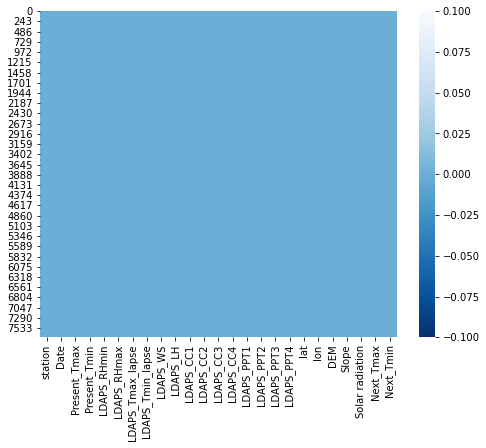

In [14]:
# Let's visualize the null values 
plt.figure(figsize=(8,6))
sns.heatmap(df.isnull(),cmap="Blues_r")
plt.show()

So it is clear that there are no missing values found.

By some observation we can notice that the dataset is orderly arranged by "Date" and "station" columns so we will shuffle the dataset to avoid the problem while building the models and to get better results.

In [15]:
#lets shuffle the dataset
df = shuffle(df)
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
993,19.0,08-08-2013,32.9,26.9,70.292274,94.302246,30.944489,27.132763,8.309695,40.868304,0.430138,0.550322,0.260389,0.236143,0.549804,0.016756,0.000000,0.000000,37.5776,126.938,75.0924,1.7678,5248.685547,31.4,27.2
2366,17.0,01-08-2014,32.7,21.6,48.591167,84.166023,34.338918,25.333024,8.710489,147.656176,0.409164,0.299555,0.322919,0.482160,0.065084,0.000000,0.000000,0.271654,37.6181,127.099,53.4712,0.6970,5404.463867,34.0,24.2
1774,25.0,08-07-2014,29.5,24.3,48.306915,84.206177,35.288582,25.664152,5.956511,59.122170,0.577917,0.389382,0.434058,0.696693,0.000000,0.000000,0.752436,0.543365,37.5237,126.970,19.5844,0.2713,5795.938965,33.8,25.3
4977,3.0,13-07-2016,28.9,22.9,41.821899,83.570679,31.648350,23.924217,7.938771,29.712206,0.153490,0.138968,0.225796,0.121203,0.263700,0.000000,0.004096,0.000000,37.5776,127.058,33.3068,0.2661,5735.222656,32.1,23.6
6006,7.0,23-08-2016,32.0,27.2,62.234764,86.061272,29.648640,25.834683,4.839175,125.300368,0.352198,0.417417,0.257740,0.059068,0.000000,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,4671.159180,33.2,26.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7089,15.0,04-08-2017,33.3,25.8,36.554966,73.090355,37.438654,28.137417,6.772227,25.697615,0.015465,0.022138,0.003635,0.058769,0.000000,0.000000,0.000000,0.000000,37.5507,126.937,30.0464,0.8552,5330.428223,36.4,27.7
6287,13.0,03-07-2017,28.7,22.0,43.769032,92.208420,32.573196,23.175801,6.470117,69.864498,0.746611,0.159544,0.237722,0.134749,2.574207,0.000000,0.000000,0.000000,37.5776,127.083,59.8324,2.6865,5842.815430,32.8,24.0
2638,14.0,12-08-2014,29.6,22.5,62.489918,87.454720,27.170970,23.626957,4.646035,9.689729,0.325550,0.594588,0.650851,0.634073,0.000000,0.000394,0.000000,0.000000,37.4967,126.927,30.9680,0.6180,5086.431152,27.1,21.7
326,2.0,13-07-2013,25.2,22.2,90.159149,96.207031,26.072713,24.366241,9.713969,42.284836,0.914626,0.814894,0.892207,0.693951,15.757655,1.084112,1.584963,0.000000,37.6046,127.032,44.7624,0.5141,5753.916504,25.6,23.3


In [16]:
# Checking the type of dataset
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

All the columns in the dataset have float type data except Date column which has object data type. All the columns have numeric values so no need to encode the data. Since Date column is in object type we will convert this in to datetime type.

## Feature Engineering

First we will convert Date column from object type to datetime and then we will extract Day, Month and Year from Date column.

In [17]:
# Converting Date  column from object type to Datetime Type
df['Date']=pd.to_datetime(df['Date'])

In [18]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

We have converted Date column data type from object to datetime type.

In [19]:
# Extracting Day from Date column
df["Day"] = df["Date"].dt.day

# Extracting Month from Date column
df["Month"] = df["Date"].dt.month

# Extracting Year from Date column
df["Year"] = df["Date"].dt.year

Now we have extracted Day, Month and Year from Date column so we can drop this column as it is of no use.

In [20]:
# Dropping Date column
df.drop("Date",axis=1,inplace=True)

In [21]:
df.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
993,19.0,32.9,26.9,70.292274,94.302246,30.944489,27.132763,8.309695,40.868304,0.430138,0.550322,0.260389,0.236143,0.549804,0.016756,0.000000,0.000000,37.5776,126.938,75.0924,1.7678,5248.685547,31.4,27.2,8,8,2013
2366,17.0,32.7,21.6,48.591167,84.166023,34.338918,25.333024,8.710489,147.656176,0.409164,0.299555,0.322919,0.482160,0.065084,0.000000,0.000000,0.271654,37.6181,127.099,53.4712,0.6970,5404.463867,34.0,24.2,8,1,2014
1774,25.0,29.5,24.3,48.306915,84.206177,35.288582,25.664152,5.956511,59.122170,0.577917,0.389382,0.434058,0.696693,0.000000,0.000000,0.752436,0.543365,37.5237,126.970,19.5844,0.2713,5795.938965,33.8,25.3,7,8,2014
4977,3.0,28.9,22.9,41.821899,83.570679,31.648350,23.924217,7.938771,29.712206,0.153490,0.138968,0.225796,0.121203,0.263700,0.000000,0.004096,0.000000,37.5776,127.058,33.3068,0.2661,5735.222656,32.1,23.6,13,7,2016
6006,7.0,32.0,27.2,62.234764,86.061272,29.648640,25.834683,4.839175,125.300368,0.352198,0.417417,0.257740,0.059068,0.000000,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,4671.159180,33.2,26.9,23,8,2016


We have extracted Day, Month and Year from Date column and dropped Date the column.

In [22]:
# To get good overview of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7752 entries, 993 to 1419
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7752 non-null   float64
 1   Present_Tmax      7752 non-null   float64
 2   Present_Tmin      7752 non-null   float64
 3   LDAPS_RHmin       7752 non-null   float64
 4   LDAPS_RHmax       7752 non-null   float64
 5   LDAPS_Tmax_lapse  7752 non-null   float64
 6   LDAPS_Tmin_lapse  7752 non-null   float64
 7   LDAPS_WS          7752 non-null   float64
 8   LDAPS_LH          7752 non-null   float64
 9   LDAPS_CC1         7752 non-null   float64
 10  LDAPS_CC2         7752 non-null   float64
 11  LDAPS_CC3         7752 non-null   float64
 12  LDAPS_CC4         7752 non-null   float64
 13  LDAPS_PPT1        7752 non-null   float64
 14  LDAPS_PPT2        7752 non-null   float64
 15  LDAPS_PPT3        7752 non-null   float64
 16  LDAPS_PPT4        7752 non-null   float6

This gives the information about the dataset which includes indexing type, column type, non-null values and memory usage. Here we can observe all the columns have float data type except Day, Month and Year which have integer data type..

In [23]:
# Checking number of unique values in each column
df.nunique()

station               25
Present_Tmax         168
Present_Tmin         156
LDAPS_RHmin         7673
LDAPS_RHmax         7664
LDAPS_Tmax_lapse    7676
LDAPS_Tmin_lapse    7675
LDAPS_WS            7675
LDAPS_LH            7675
LDAPS_CC1           7570
LDAPS_CC2           7583
LDAPS_CC3           7599
LDAPS_CC4           7524
LDAPS_PPT1          2812
LDAPS_PPT2          2510
LDAPS_PPT3          2356
LDAPS_PPT4          1918
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            184
Next_Tmin            158
Day                   21
Month                 12
Year                   5
dtype: int64

These are the number of unique values present in each columns.

In [24]:
# Checking how many columns are there in the dataset
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month', 'Year'],
      dtype='object')

These are the columns present in the dataset.

In [25]:
# Checking the list of counts of Next_Tmax
df['Next_Tmax'].value_counts()

29.3    113
33.0    106
31.3    104
29.6    101
31.2     98
       ... 
18.6      1
19.5      1
38.7      1
19.7      1
38.3      1
Name: Next_Tmax, Length: 184, dtype: int64

These are the value counts of the target Next_Tmax.

In [26]:
# Checking the list of counts of Next_Tmin
df['Next_Tmin'].value_counts()

23.5    159
23.4    157
24.0    156
23.2    150
23.8    149
       ... 
14.6      1
13.6      1
28.2      1
29.0      1
29.5      1
Name: Next_Tmin, Length: 158, dtype: int64

These are the value counts of the target Next_Tmin.

## Description of Dataset

In [27]:
# Statistical summary of dataset
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,12.997033,29.768211,23.225059,56.759372,88.388529,29.613447,23.514984,7.092549,62.450457,0.368774,0.356080,0.317864,0.298499,0.586267,0.480310,0.275508,0.266801,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220,16.374742,7.080882,2015.000516
std,7.213007,2.956557,2.403036,14.596973,7.158471,2.932898,2.334099,2.173913,33.571540,0.261185,0.256810,0.249208,0.253211,1.937198,1.754900,1.156495,1.200654,0.050352,0.079435,54.279780,1.370444,429.158867,3.122557,2.483276,8.243617,2.238124,1.414487
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000,7.000000,1.000000,2013.000000
25%,7.000000,27.800000,21.700000,46.046162,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,0.142328,0.103100,0.082741,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000,8.000000,7.000000,2014.000000
50%,13.000000,29.900000,23.400000,55.313244,89.793480,29.662273,23.760199,6.547470,56.865482,0.320110,0.315667,0.262555,0.227664,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,16.000000,7.000000,2015.000000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,0.554963,0.494007,0.497230,0.049122,0.016748,0.007231,0.000000,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,24.000000,8.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000,31.000000,12.000000,2017.000000


This gives the statistical information of the dataset. The summary of this dataset looks perfect since there is no negative/ invalid values present.

From the above description we can observe the following things.
1. The counts of columns are same which means there are no missing values present in the dataset.
2. In most of the columns, mean is greater than the median(50%) which means they are skewed to right.
3.  Some columns like LDAPS_RHmax, Solar radiation etc, have median value bit greater than the mean value hence they are skewed to left.
4. Also the columns like Station, Present_Tmax, lon, lat etc, have almost same mean and median values that means the data is normal and symmetric also they have no skewness.
5. By summarising the data, we can observe the column LDAPS_RHmin has huge outliers from the max of 98.52 which is quite far from the mean and the median. These differences can also be seen in other columns too. From the huge difference between the max and 75% percentile we can assume there are outliers present in the data.

# Data Visualization
# Univariate Analysis

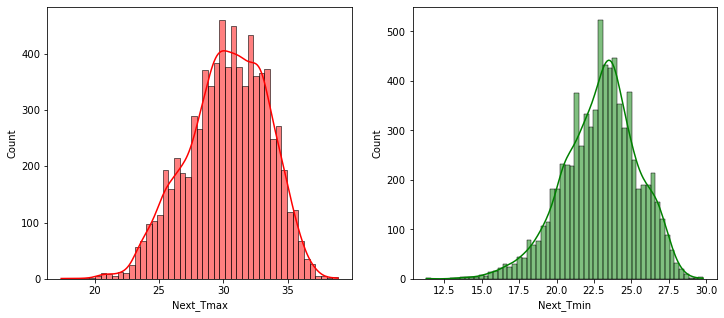

In [28]:
# Plotting histographs for target variables 
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['Next_Tmax'],kde=True,color='r')
plt.subplot(1,2,2)
sns.histplot(df['Next_Tmin'],kde=True,color='g')
plt.show()

From the above plot we can observe that the data is normally distributed in both the target variabes Next_Tmax and Next_Tmin since the data is symmetric so there is no skewness present in these columns.

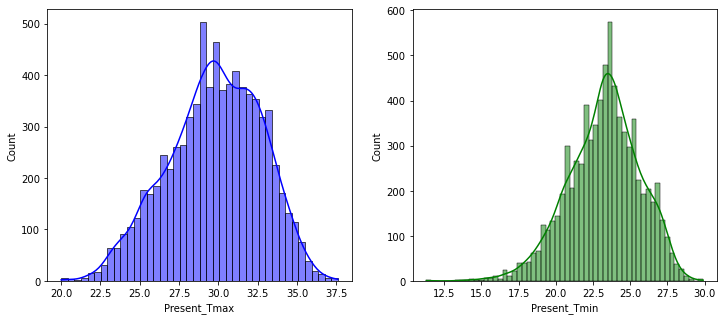

In [29]:
# Plotting histographs for Present_Tmax and Present_Tmin variables 
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['Present_Tmax'],kde=True,color='b')
plt.subplot(1,2,2)
sns.histplot(df['Present_Tmin'],kde=True,color='g')
plt.show()

Here also the data is symmetric and normally distributed in both the columns and there is no skewness present in the data.

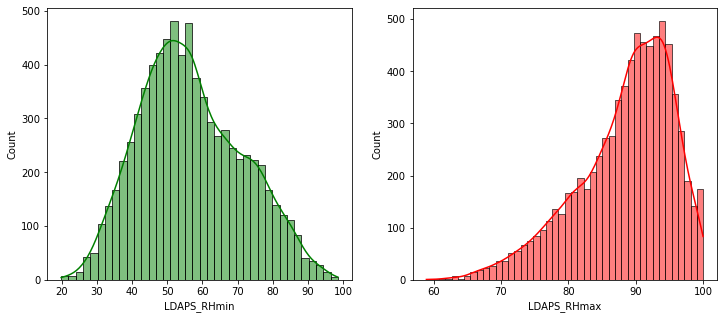

In [30]:
# Plotting histographs for  variables 
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['LDAPS_RHmin'],kde=True,color='g')
plt.subplot(1,2,2)
sns.histplot(df['LDAPS_RHmax'],kde=True,color='r')
plt.show()

- The data is symmetric and normally distributed in LDAPS_RHmin column also there is no skewness in the data.
- The data is almost normal in LDAPS_RHmax column but it is skewed to left since the median is more than the mean.

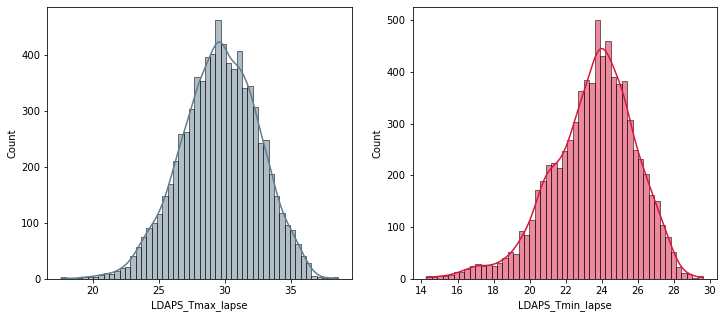

In [31]:
# Plotting histographs for  variables 
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['LDAPS_Tmax_lapse'],kde=True,color='#607c8e')
plt.subplot(1,2,2)
sns.histplot(df['LDAPS_Tmin_lapse'],kde=True,color='crimson')
plt.show()

- The data is normally distributed in both the columns.
- There is no skewness in the column LDAPS_Tmax_lapse but the column LDAPS_Tmin_lapse is bit skewed to left.

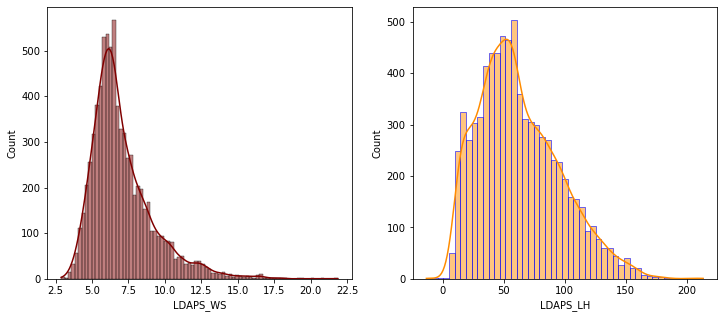

In [32]:
# Plotting histographs for  variables 
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['LDAPS_WS'],kde=True,color='maroon')
plt.subplot(1,2,2)
sns.histplot(df['LDAPS_LH'],kde=True,color='darkorange',edgecolor="b")
plt.show()

The data is almost normal in both the columns but the median is greater than the mean in the columns, hence they are skewed to right.

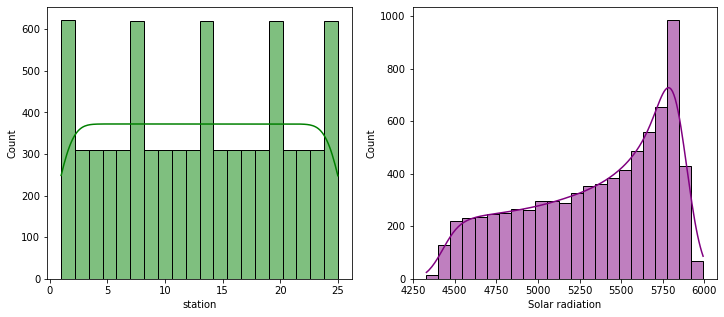

In [33]:
# Plotting histographs for  variables 
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['station'],kde=True,color='g')
plt.subplot(1,2,2)
sns.histplot(df['Solar radiation'],kde=True,color="purple")
plt.show()

- The data is normally distributed in station column and there is no skewness present in this column.
- The mean is less than median in Solar radiation column so the data is skewed to left in this column.

### distplot

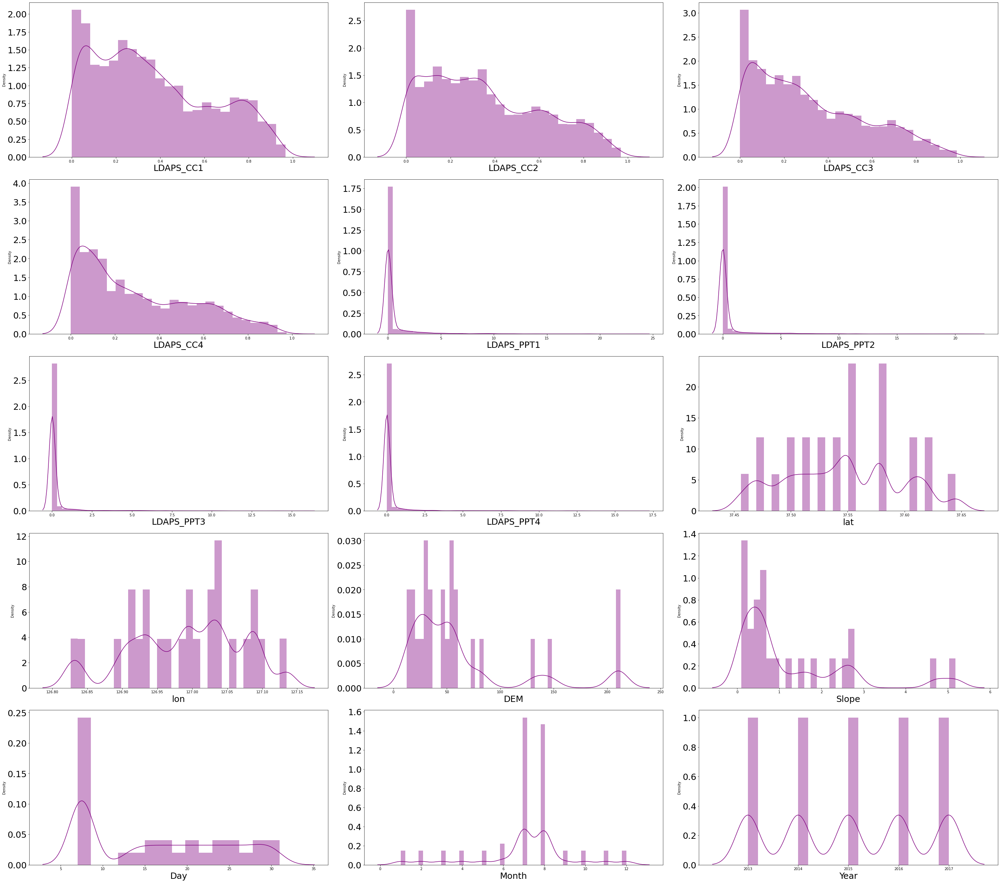

In [34]:
# Let's check how the data has been distributed in remaining columns
plt.figure(figsize=(40,70),facecolor='white')
plotnumber=1
for column in df.columns.drop(["Next_Tmax","Next_Tmin","Solar radiation"]):
    if plotnumber>=10:
        ax=plt.subplot(10,3,plotnumber)
        sns.distplot(df[column],color="purple")
        plt.xlabel(column,fontsize=25)
        plt.yticks(rotation=0,fontsize=25)
    plotnumber+=1
plt.tight_layout()

- From the above distribution plot we can observe that the data is almost normal in first three columns but they are skewed to right.
- Most of the columns have right skewness and the data is not normal in those columns.

## Bivariate Analysis

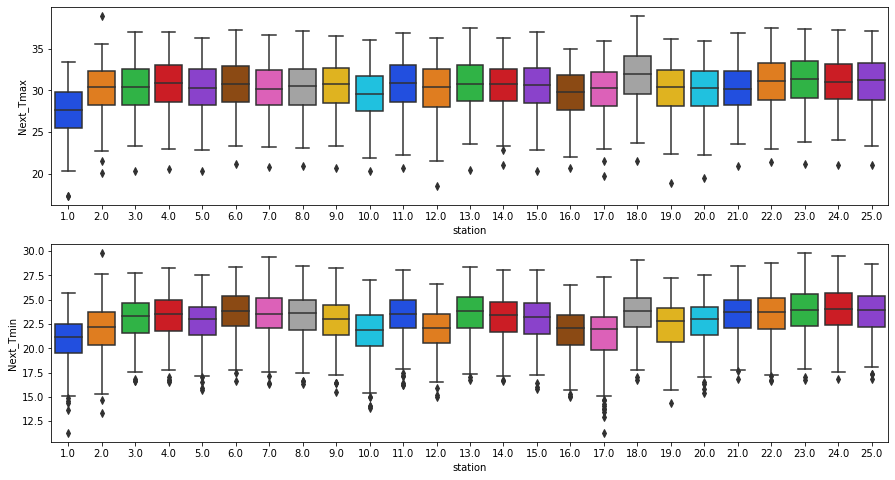

In [35]:
# Visualizing the relation between station and the target variables
plt.figure(figsize=(15,8))
plt.subplot(2,1,1)
sns.boxplot(df['station'],df["Next_Tmax"],data=df,palette="bright")
plt.subplot(2,1,2)
sns.boxplot(df['station'],df["Next_Tmin"],data=df,palette="bright")
plt.show()

From the box plot we can notice the station 18 has highest temperature collection for both Next_Tmax and Next_Tmin targets while station 1 observes lowest temperature for both the targets. This could be because of the stations location.

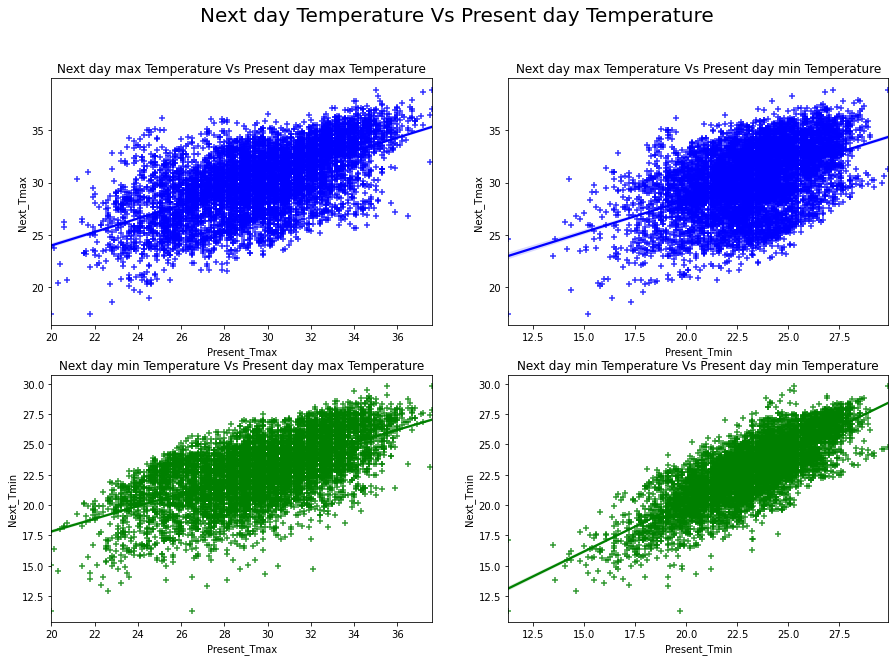

In [36]:
# Comparing Next day temperature and Present day temperature

plt.figure(figsize=(15,10))
plt.suptitle('Next day Temperature Vs Present day Temperature',fontsize=20)

plt.subplot(2,2,1)
plt.title('Next day max Temperature Vs Present day max Temperature')
sns.regplot(x='Present_Tmax',y='Next_Tmax',data=df,marker="+",color='b')

plt.subplot(2,2,2)
plt.title('Next day max Temperature Vs Present day min Temperature')
sns.regplot(x='Present_Tmin',y='Next_Tmax',data=df,marker="+",color='b')

plt.subplot(2,2,3)
plt.title('Next day min Temperature Vs Present day max Temperature')
sns.regplot(x='Present_Tmax',y='Next_Tmin',data=df,marker="+",color='g')

plt.subplot(2,2,4)
plt.title('Next day min Temperature Vs Present day min Temperature')
sns.regplot(x='Present_Tmin',y='Next_Tmin',data=df,marker="+",color="g")
plt.show()

- Present_Tmax and Present_Tmin columns contains the data of maximum and minimum air temperature of the present day.
- There is a strong linear relationship between the Next day temperature and Present day temperature.
- Present_Tmin column has bit less relation with Next_Tmin compared to others.
- As Present day Tmax and Tmin increases then Next_Tmin and Next_Tmax temperature also increases

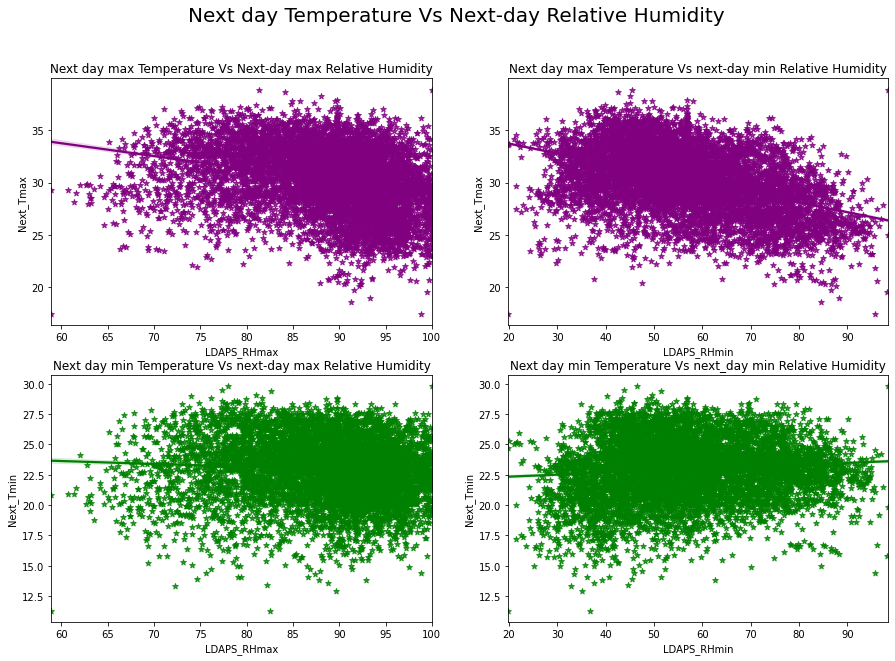

In [37]:
# Comparing Next day temperature and next day Relative Humidity

plt.figure(figsize=(15,10))
plt.suptitle('Next day Temperature Vs Next-day Relative Humidity',fontsize=20)

plt.subplot(2,2,1)
plt.title('Next day max Temperature Vs Next-day max Relative Humidity')
sns.regplot(x='LDAPS_RHmax',y='Next_Tmax',data=df,marker="*",color='purple')

plt.subplot(2,2,2)
plt.title('Next day max Temperature Vs next-day min Relative Humidity')
sns.regplot(x='LDAPS_RHmin',y='Next_Tmax',data=df,marker="*",color='purple')

plt.subplot(2,2,3)
plt.title('Next day min Temperature Vs next-day max Relative Humidity')
sns.regplot(x='LDAPS_RHmax',y='Next_Tmin',data=df,marker="*",color='g')

plt.subplot(2,2,4)
plt.title('Next day min Temperature Vs next_day min Relative Humidity')
sns.regplot(x='LDAPS_RHmin',y='Next_Tmin',data=df,marker="*",color="g")
plt.show()

- The columns LDAPS_RHmax and LDAPS_RHmin contains the forecast of next-day maximum and minimum Relative humidity in percentage(%) respectively.
- Next day Tmax decreases with increase in LDAPS_RHmax and LDAPS_RHmin but it is not true in case of Next_Tmin, as Next day Tmin seems to be unaffected by RHmax and we can also observe slight positive correlation between Next_Tmin and RHmin.

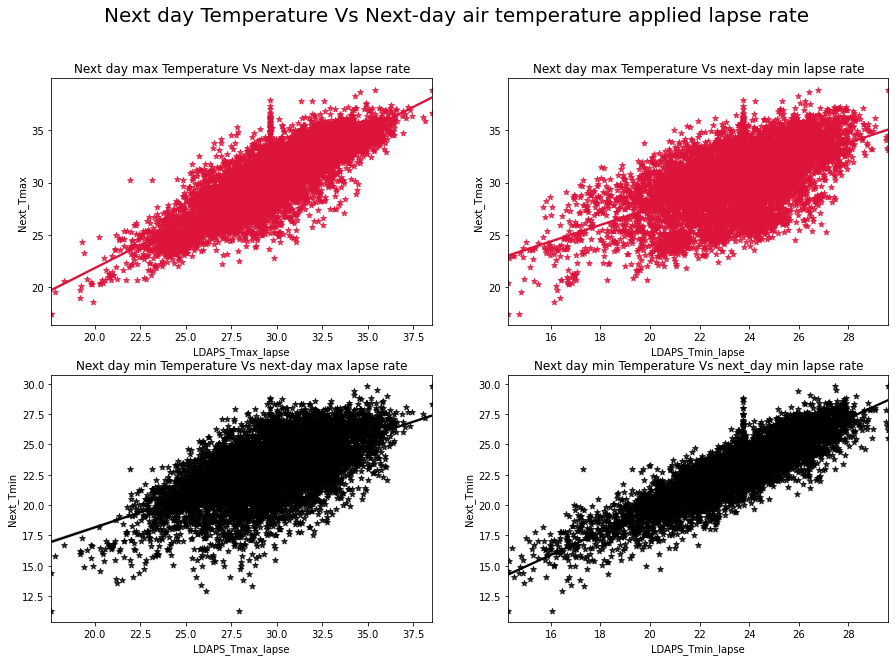

In [38]:
# Comparing Next day temperature and next day air temperature applied lapse rate (Â°C)

plt.figure(figsize=(15,10))
plt.suptitle('Next day Temperature Vs Next-day air temperature applied lapse rate',fontsize=20)

plt.subplot(2,2,1)
plt.title('Next day max Temperature Vs Next-day max lapse rate')
sns.regplot(x='LDAPS_Tmax_lapse',y='Next_Tmax',data=df,marker="*",color='crimson')

plt.subplot(2,2,2)
plt.title('Next day max Temperature Vs next-day min lapse rate')
sns.regplot(x='LDAPS_Tmin_lapse',y='Next_Tmax',data=df,marker="*",color='crimson')

plt.subplot(2,2,3)
plt.title('Next day min Temperature Vs next-day max lapse rate')
sns.regplot(x='LDAPS_Tmax_lapse',y='Next_Tmin',data=df,marker="*",color='k')

plt.subplot(2,2,4)
plt.title('Next day min Temperature Vs next_day min lapse rate')
sns.regplot(x='LDAPS_Tmin_lapse',y='Next_Tmin',data=df,marker="*",color="k")
plt.show()

- LDAPS_Tmax_lapse and LDAPS_Tmin_lapse is forecast of next-day maximum and minimum air temperature applied lapse rate (Â°C) respectively.
- There is a strong positive linear relationship between target variables Next day temperature and Next day air temperature applied lapse rate.
- As Next day air temperature applied lapse rate increases, Next day temperature is also increasing.

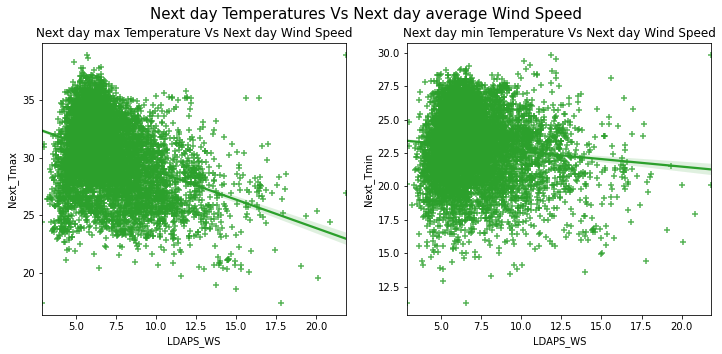

In [41]:
# Comparing Next day temperature and  Next day Average Wind Speed

plt.figure(figsize=(12,5))
plt.suptitle('Next day Temperatures Vs Next day average Wind Speed',fontsize=15)

plt.subplot(1,2,1)
plt.title('Next day max Temperature Vs Next day Wind Speed') 
sns.regplot(x='LDAPS_WS',y='Next_Tmax',data=df,marker='+',color="tab:green")

plt.subplot(1,2,2)
plt.title('Next day min Temperature Vs Next day Wind Speed') 
sns.regplot(x='LDAPS_WS',y='Next_Tmin',data=df,marker='+',color="tab:green")
plt.show()

- LDAPS_WS is forecast of next-day average wind speed in (m/s).
- There is very less relation of wind speed with the target variables. As wind speed increases, Next day temperature decreases also Next day Tmax seems to decrease more drastically compared to Next day Tmin.
- From the graph we can observe the Wind Speed is mostly 2.8 to 10 m/s.

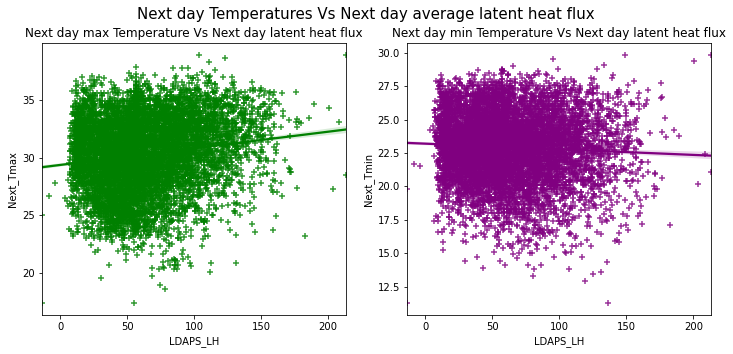

In [40]:
# # Comparing Next day temperature and  Next day Average latent heat flux (W/m2)

plt.figure(figsize=(12,5))
plt.suptitle('Next day Temperatures Vs Next day average latent heat flux',fontsize=15)

plt.subplot(1,2,1)
plt.title('Next day max Temperature Vs Next day latent heat flux') 
sns.regplot(x='LDAPS_LH',y='Next_Tmax',data=df,marker='+',color="g")

plt.subplot(1,2,2)
plt.title('Next day min Temperature Vs Next day latent heat flux') 
sns.regplot(x='LDAPS_LH',y='Next_Tmin',data=df,marker='+',color="purple")
plt.show()

- LDAPS_LH gives the forecast of next-day average latent heat flux (W/m2).
- From the plot we can notice there is no linear relation between targets and the features.
- As Latent heat flux increases, Next day Tmax is also increases slightly while Next day Tmin decreases.
- The Latent heat flux mostly distributed in the range of 10 to 160 W/m2.

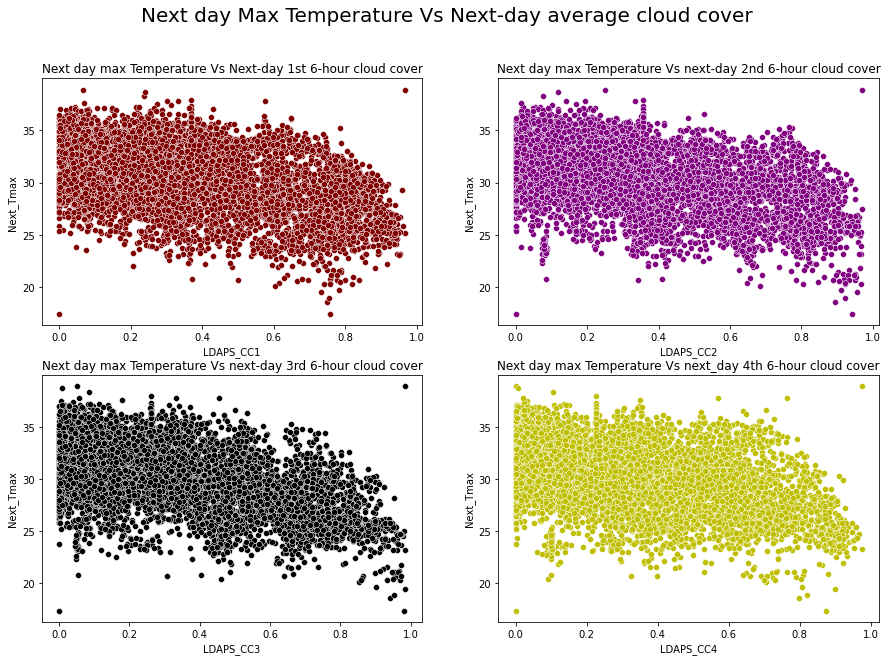

In [43]:
# Comparing Next day maximnum temperature and next day average cloud cover

plt.figure(figsize=(15,10))
plt.suptitle('Next day Max Temperature Vs Next-day average cloud cover',fontsize=20)

plt.subplot(2,2,1)
plt.title('Next day max Temperature Vs Next-day 1st 6-hour cloud cover')
sns.scatterplot(x='LDAPS_CC1',y='Next_Tmax',data=df,color="maroon")

plt.subplot(2,2,2)
plt.title('Next day max Temperature Vs next-day 2nd 6-hour cloud cover')
sns.scatterplot(x='LDAPS_CC2',y='Next_Tmax',data=df,color='purple')

plt.subplot(2,2,3)
plt.title('Next day max Temperature Vs next-day 3rd 6-hour cloud cover')
sns.scatterplot(x='LDAPS_CC3',y='Next_Tmax',data=df,color='k')

plt.subplot(2,2,4)
plt.title('Next day max Temperature Vs next_day 4th 6-hour cloud cover')
sns.scatterplot(x='LDAPS_CC4',y='Next_Tmax',data=df,color="y")
plt.show()

- By observing the plot we can infer that the column Next_Tmax goes on decreasing as the cloud cover increases irrespective of any split.
- The cloud cover liesin the range of 0 to 0.97%. Also we can say there is negative linear relation between the targets and the cloud cover.

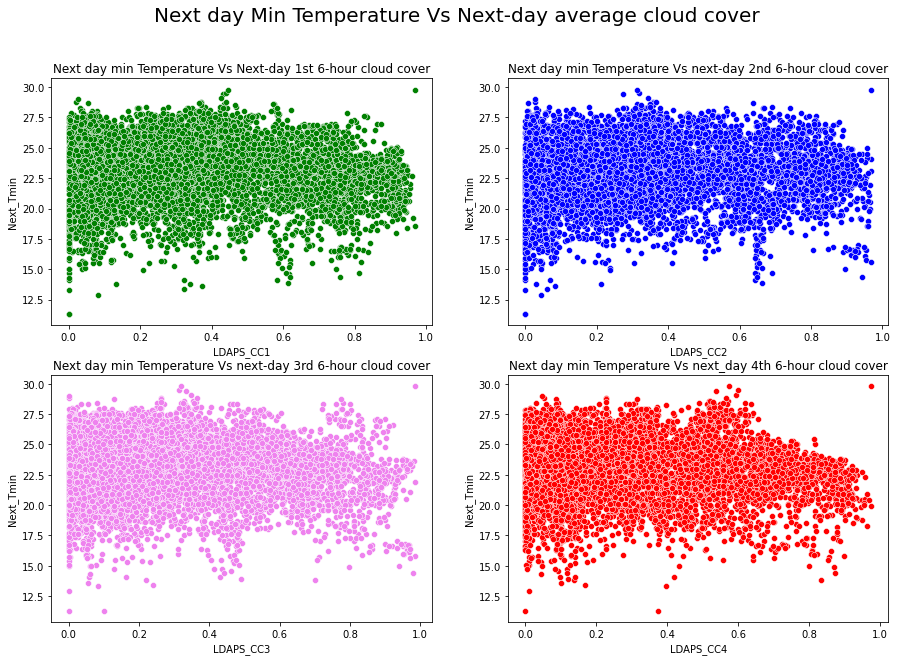

In [44]:
# Comparing Next day minimum temperature and next day average cloud cover

plt.figure(figsize=(15,10))
plt.suptitle('Next day Min Temperature Vs Next-day average cloud cover',fontsize=20)

plt.subplot(2,2,1)
plt.title('Next day min Temperature Vs Next-day 1st 6-hour cloud cover')
sns.scatterplot(x='LDAPS_CC1',y='Next_Tmin',data=df,color="g")

plt.subplot(2,2,2)
plt.title('Next day min Temperature Vs next-day 2nd 6-hour cloud cover')
sns.scatterplot(x='LDAPS_CC2',y='Next_Tmin',data=df,color='b')

plt.subplot(2,2,3)
plt.title('Next day min Temperature Vs next-day 3rd 6-hour cloud cover')
sns.scatterplot(x='LDAPS_CC3',y='Next_Tmin',data=df,color='violet')

plt.subplot(2,2,4)
plt.title('Next day min Temperature Vs next_day 4th 6-hour cloud cover')
sns.scatterplot(x='LDAPS_CC4',y='Next_Tmin',data=df,color="r")
plt.show()

- There is no significant relation between Next day temperature and cloud cover.
- We can say that Next_Tmin remains unaffected by cloud cover. And it ranges between 0-0.98%.

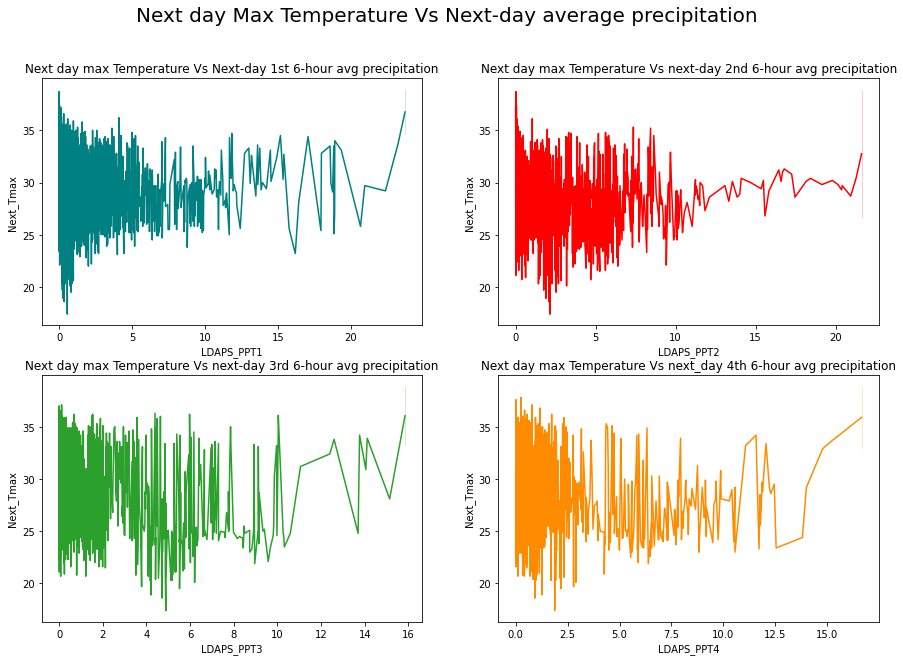

In [45]:
# Comparing Next day maximnum temperature and next day average precipitation

plt.figure(figsize=(15,10))
plt.suptitle('Next day Max Temperature Vs Next-day average precipitation',fontsize=20)

plt.subplot(2,2,1)
plt.title('Next day max Temperature Vs Next-day 1st 6-hour avg precipitation')
sns.lineplot(x='LDAPS_PPT1',y='Next_Tmax',data=df,color="teal")

plt.subplot(2,2,2)
plt.title('Next day max Temperature Vs next-day 2nd 6-hour avg precipitation')
sns.lineplot(x='LDAPS_PPT2',y='Next_Tmax',data=df,color='r')

plt.subplot(2,2,3)
plt.title('Next day max Temperature Vs next-day 3rd 6-hour avg precipitation')
sns.lineplot(x='LDAPS_PPT3',y='Next_Tmax',data=df,color='tab:green')

plt.subplot(2,2,4)
plt.title('Next day max Temperature Vs next_day 4th 6-hour avg precipitation')
sns.lineplot(x='LDAPS_PPT4',y='Next_Tmax',data=df,color="darkorange")
plt.show()

- There is no relation between average precipitation and Next day temperature.
- Next_Tmax decreases as average precipitation increases irrespective of any split.
- We can observe the average precipitation distributed mostly between 0-5% in PPT1, 0-10% in PPT2, 0-7% in PPT3 and 0-2.5% in PPT4.

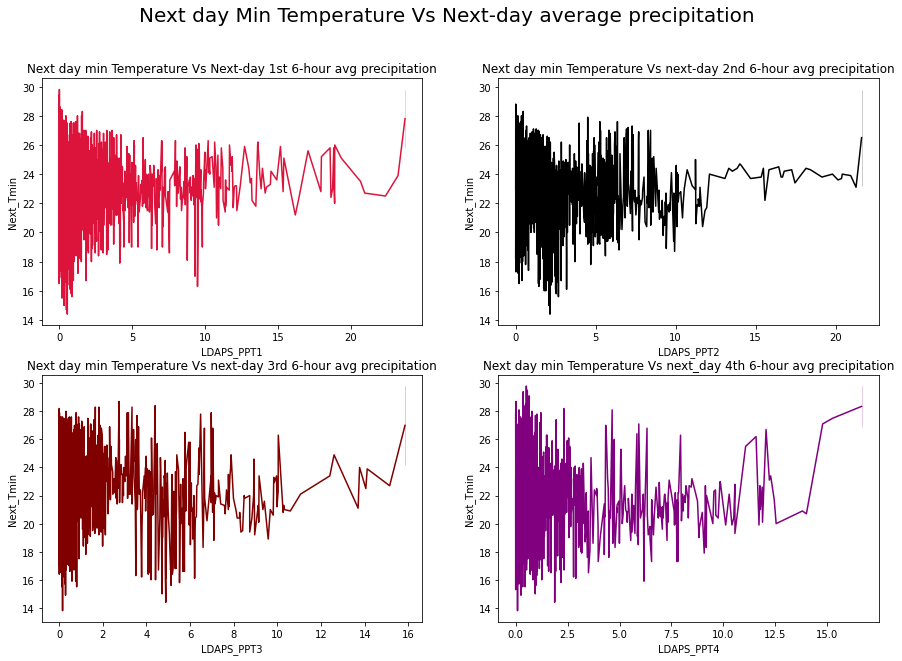

In [46]:
# Comparing Next day minimum temperature and next day average precipitation

plt.figure(figsize=(15,10))
plt.suptitle('Next day Min Temperature Vs Next-day average precipitation',fontsize=20)

plt.subplot(2,2,1)
plt.title('Next day min Temperature Vs Next-day 1st 6-hour avg precipitation')
sns.lineplot(x='LDAPS_PPT1',y='Next_Tmin',data=df,color="crimson")

plt.subplot(2,2,2)
plt.title('Next day min Temperature Vs next-day 2nd 6-hour avg precipitation')
sns.lineplot(x='LDAPS_PPT2',y='Next_Tmin',data=df,color='k')

plt.subplot(2,2,3)
plt.title('Next day min Temperature Vs next-day 3rd 6-hour avg precipitation')
sns.lineplot(x='LDAPS_PPT3',y='Next_Tmin',data=df,color='maroon')

plt.subplot(2,2,4)
plt.title('Next day min Temperature Vs next_day 4th 6-hour avg precipitation')
sns.lineplot(x='LDAPS_PPT4',y='Next_Tmin',data=df,color="purple")
plt.show()

- There is no linear relation between average precipitation and Next day temperature.
- Next_Tmin slightly increases as PPT1 and PPT2 increases also as LDAPS_PPT1 goes above 5% then Next_Tmin is above 15 degree.
- The Next_Tmin slightly decreases as LDAPS_PPT3 and LDAPS_PPT4 increases.

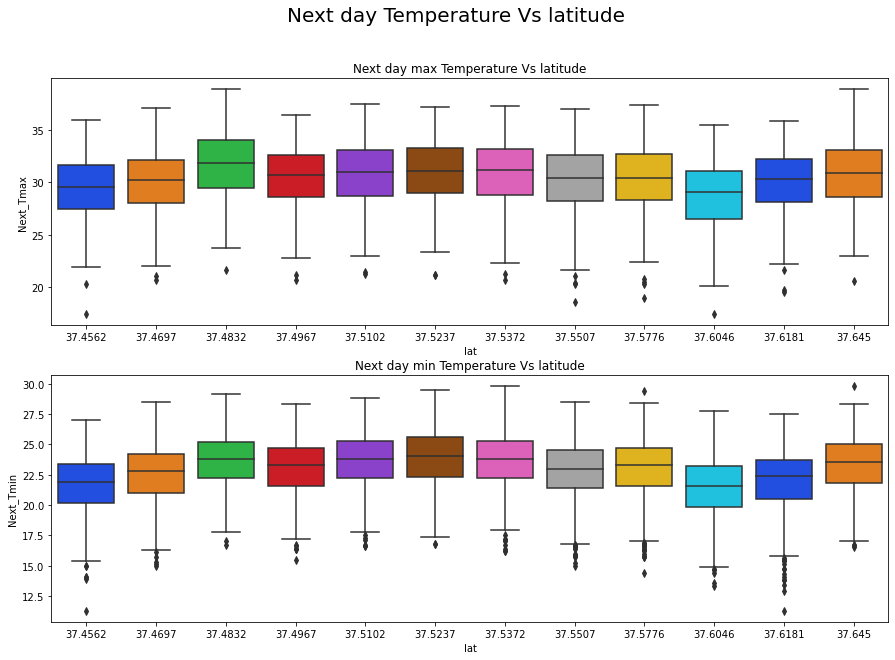

In [47]:
# Comparing Next day temperature and latitude

plt.figure(figsize=(15,10))
plt.suptitle('Next day Temperature Vs latitude',fontsize=20)

plt.subplot(2,1,1)
plt.title('Next day max Temperature Vs latitude')
sns.boxplot(x='lat',y='Next_Tmax',data=df,palette="bright")

plt.subplot(2,1,2)
plt.title('Next day min Temperature Vs latitude')
sns.boxplot(x='lat',y='Next_Tmin',data=df,palette="bright")
plt.show()

- The highest temperature is observed at latitude range 37.4832 for Next_Tmax but this is not the case for Next_Tmin, that could be because of other factors affect the temperature.
- Also the temperature seems to fall down as latitude increases in both the cases.

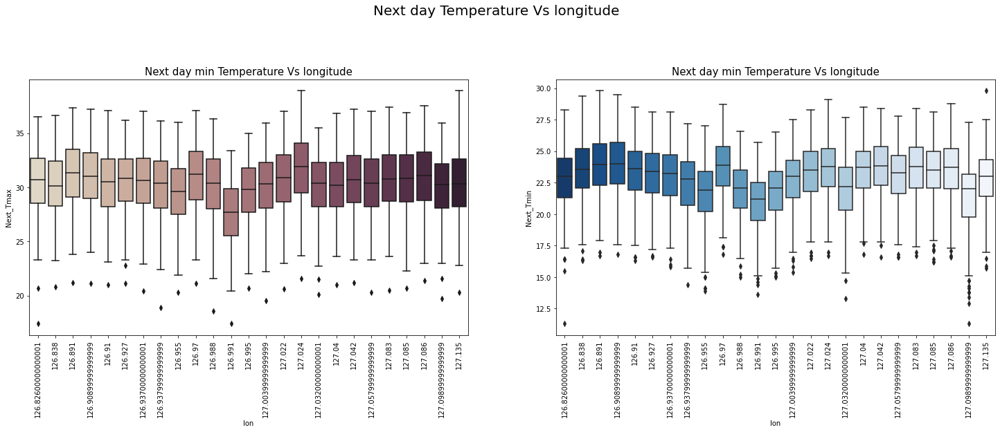

In [48]:
# Comparing Next day temperature and longitude

plt.figure(figsize=(25,15))
plt.suptitle('Next day Temperature Vs longitude',fontsize=20)

plt.subplot(2,2,1)
plt.title('Next day min Temperature Vs longitude',fontsize=15)
sns.boxplot(x='lon',y='Next_Tmax',data=df,palette="ch:.28")
plt.xticks(rotation=90)

plt.subplot(2,2,2)
plt.title('Next day min Temperature Vs longitude',fontsize=15)
sns.boxplot(x='lon',y='Next_Tmin',data=df,palette="Blues_r")
plt.xticks(rotation=90)
plt.show()

- From the graph we can say that longitude is not affecting much Next day temperature. As the longitude increases, Next_Tmax also increases for first three longitudes and then it decreases. This increase and decrease continuous tll the end.
- Same thing happens in the case of Next_Tmin also.

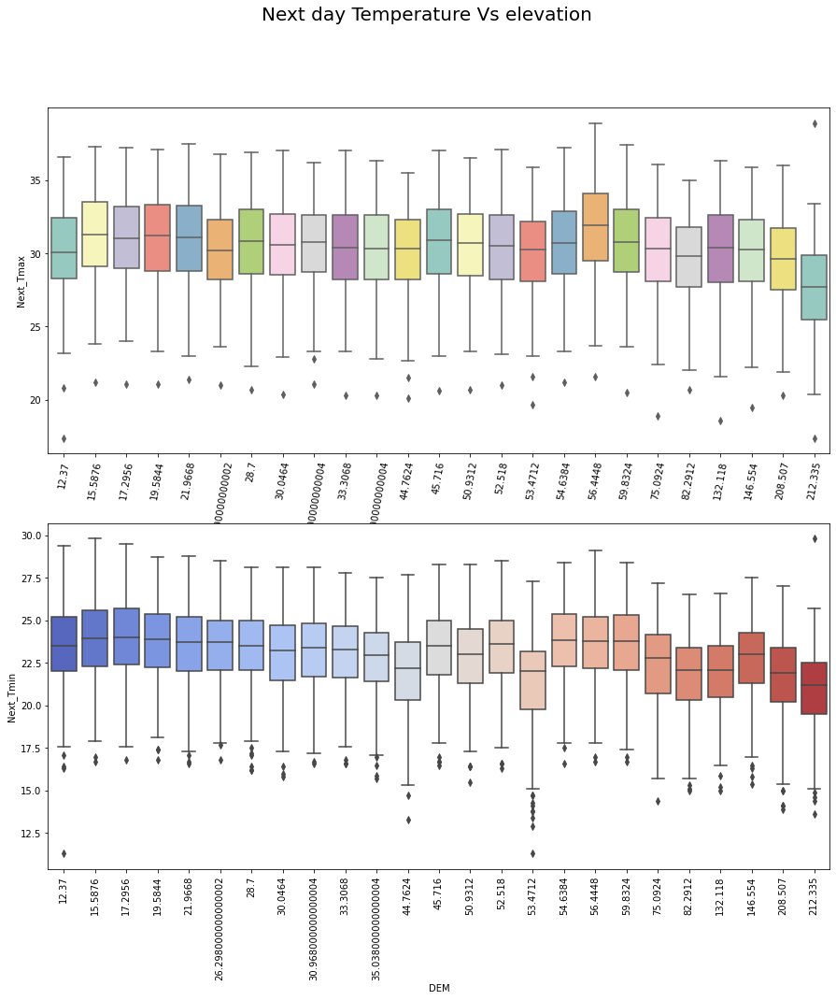

In [49]:
# Comparing Next day temperature and elevation

plt.figure(figsize=(15,15))
plt.suptitle('Next day Temperature Vs elevation',fontsize=20)

plt.subplot(2,1,1)
sns.boxplot(x='DEM',y='Next_Tmax',data=df,palette="Set3")
plt.xticks(rotation=80)

plt.subplot(2,1,2)
sns.boxplot(x='DEM',y='Next_Tmin',data=df,palette="coolwarm")
plt.xticks(rotation=90)
plt.show()

- The highest temperature is observed at the elevation56.4448 for Next_Tmax but this is not the case in Next_Tmin.
- In the first graph we can observe as the elevation increases, temperature decreases. This is true only for last 10 elevations, for remaining elevations are not affecting the temperature that much.
- In the second graph we can infer that the temperature decreases first and then increases and this increase and decrese of temperature is continuing till the end.

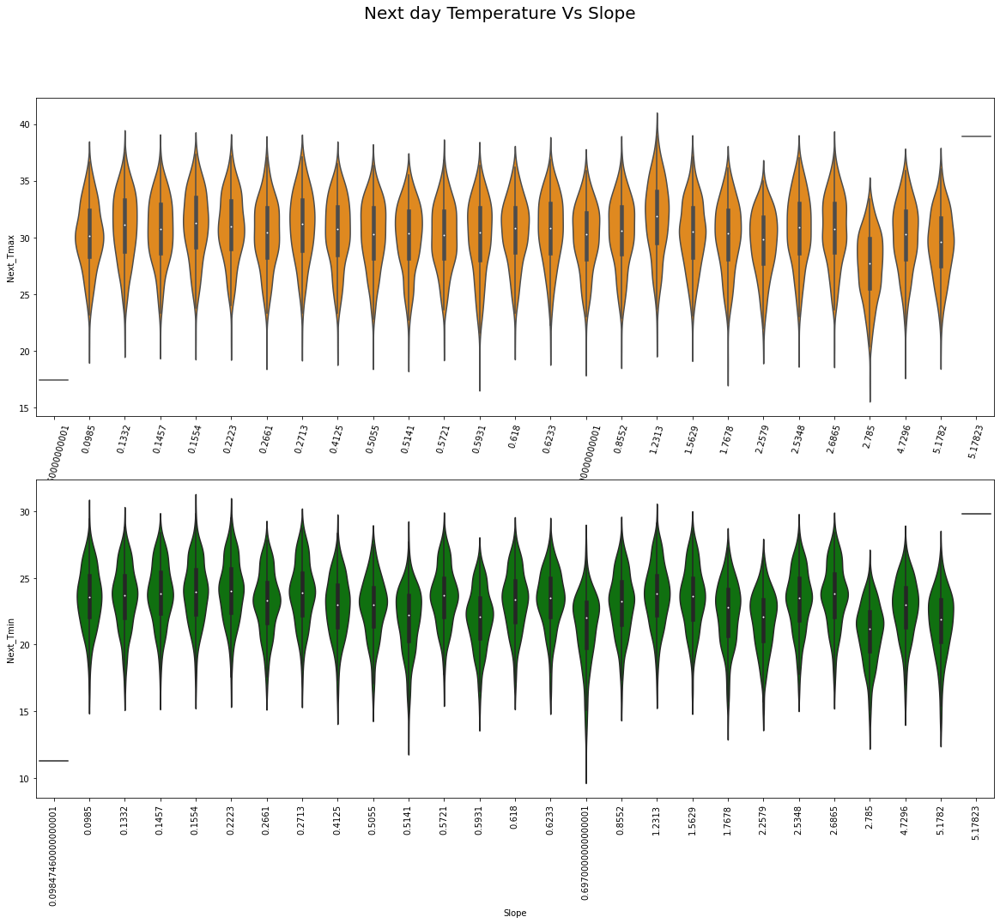

In [50]:
# Comparing Next day temperature and slope

plt.figure(figsize=(20,15))
plt.suptitle('Next day Temperature Vs Slope',fontsize=20)

plt.subplot(2,1,1)
sns.violinplot(x='Slope',y='Next_Tmax',data=df,color="darkorange")
plt.xticks(rotation=75)

plt.subplot(2,1,2)
sns.violinplot(x='Slope',y='Next_Tmin',data=df,color="g")
plt.xticks(rotation=90)
plt.show()

- From the graph we can see as the slopes increases, the temperature also increases in both the cases.
- Lowest and highest temperatures observed at consecutive slopes 2.785 and 1.2313 respectively in both the cases.

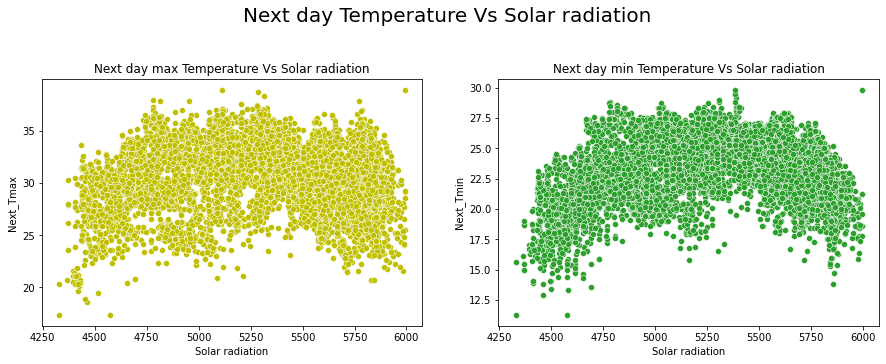

In [51]:
# Comparing Next day temperature and Solar radiation

plt.figure(figsize=(15,10))
plt.suptitle('Next day Temperature Vs Solar radiation',fontsize=20)

plt.subplot(2,2,1)
plt.title('Next day max Temperature Vs Solar radiation')
sns.scatterplot(x='Solar radiation',y='Next_Tmax',data=df,color="y")

plt.subplot(2,2,2)
plt.title('Next day min Temperature Vs Solar radiation')
sns.scatterplot(x='Solar radiation',y='Next_Tmin',data=df,color="tab:green")
plt.show()

The solar radiations does not seem to affect the Tmax and Tmin. By looking at the plot we can say that when the daily incoming solar radiations are in the range 4750 to 5300, the temperature is high.

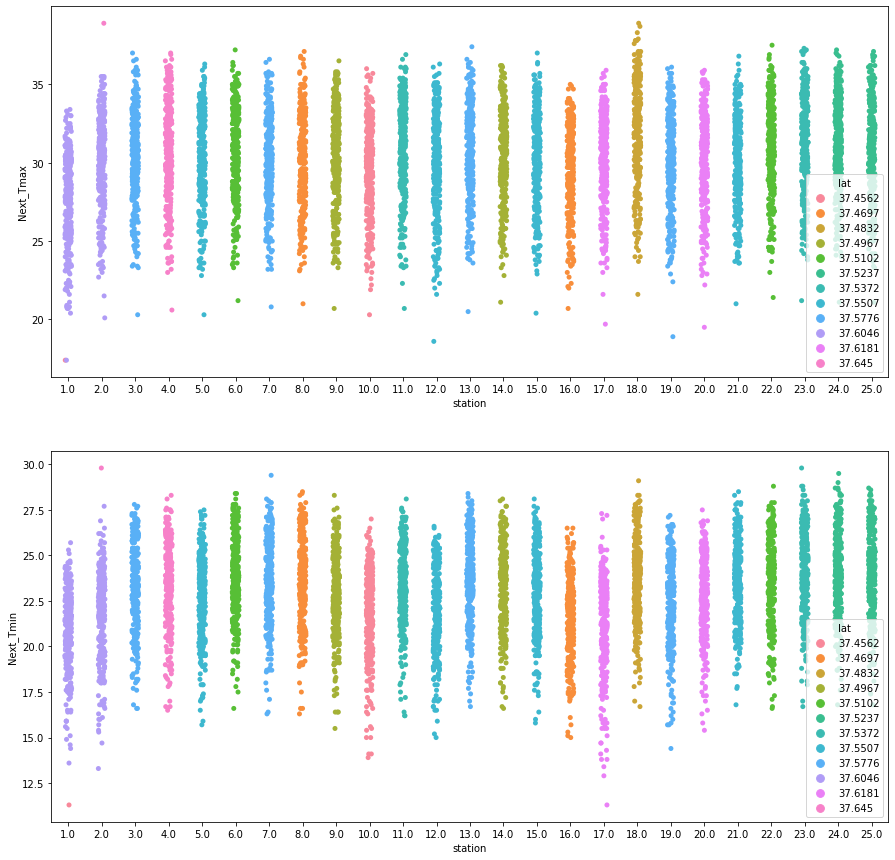

In [52]:
# Visualizing the relation between station and the target variables on the basis of latitude
plt.figure(figsize=(15,15))
plt.subplot(2,1,1)
sns.stripplot(df['station'],df["Next_Tmax"],data=df,hue=df["lat"])
plt.subplot(2,1,2)
sns.stripplot(df['station'],df["Next_Tmin"],data=df,hue=df["lat"])
plt.show()

- Each station is located on the particular latitude. There are atmost 3 stations on single latitude.
- As the latitude decreases in each station, the temperture seemd to be increases.

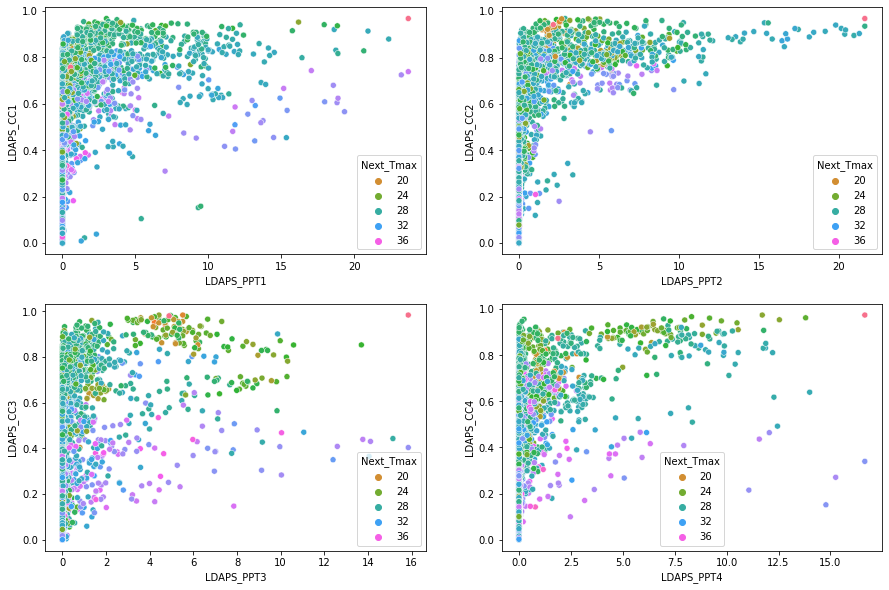

In [53]:
plt.figure(figsize=(15,10))

plt.subplot(2,2,1)
sns.scatterplot(x='LDAPS_PPT1',y='LDAPS_CC1',hue='Next_Tmax',data=df,palette="husl")

plt.subplot(2,2,2)
sns.scatterplot(x='LDAPS_PPT2',y='LDAPS_CC2',hue='Next_Tmax',data=df,palette="husl")

plt.subplot(2,2,3)
sns.scatterplot(x='LDAPS_PPT3',y='LDAPS_CC3',hue='Next_Tmax',data=df,palette="husl")

plt.subplot(2,2,4)
sns.scatterplot(x='LDAPS_PPT4',y='LDAPS_CC4',hue='Next_Tmax',data=df,palette="husl")
plt.show()

- In all the graphs the Next_Tmax is higher when the precipitation and cloud cover both have lower value.
- In the first split of cloud cover and precipitation , precipitation increases after the cloud cover value crosses 0.2 while this threshold increases to 0.5 in 2nd split after that it decreses for all the splits.
- We can observe the presence of outliers from the graph.

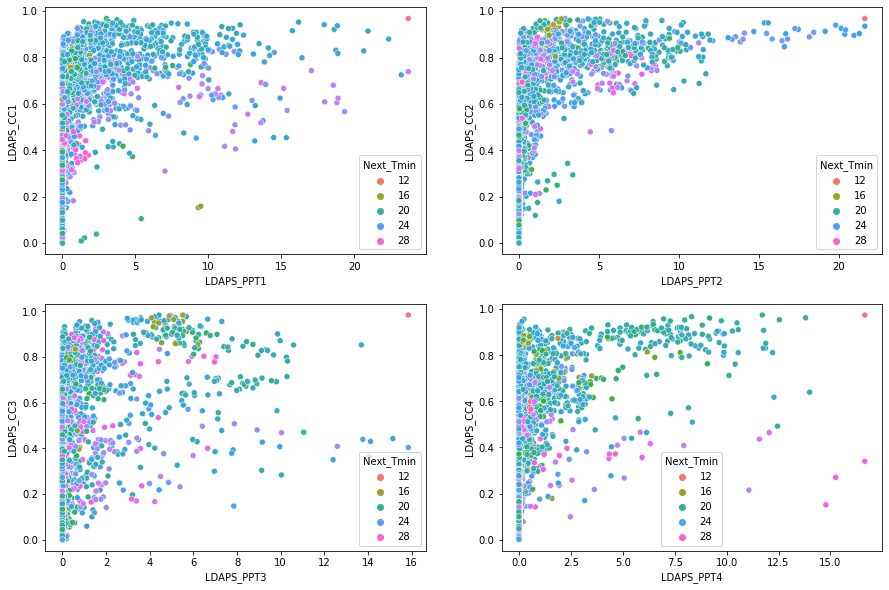

In [54]:
plt.figure(figsize=(15,10))

plt.subplot(2,2,1)
sns.scatterplot(x='LDAPS_PPT1',y='LDAPS_CC1',hue='Next_Tmin',data=df,palette="husl")

plt.subplot(2,2,2)
sns.scatterplot(x='LDAPS_PPT2',y='LDAPS_CC2',hue='Next_Tmin',data=df,palette="husl")

plt.subplot(2,2,3)
sns.scatterplot(x='LDAPS_PPT3',y='LDAPS_CC3',hue='Next_Tmin',data=df,palette="husl")

plt.subplot(2,2,4)
sns.scatterplot(x='LDAPS_PPT4',y='LDAPS_CC4',hue='Next_Tmin',data=df,palette="husl")
plt.show()

- Here also same thing happens that was happend in the case of Tmax. In all the graphs the Next_Tmax is higher when the precipitation and cloud cover both have lower value.
- In the first split of cloud cover and precipitation , precipitation increases after the cloud cover value crosses 0.2 while this threshold increases to 0.5 in 2nd split after that it decreses for all the splits.
- We can observe the presence of outliers from the graph.


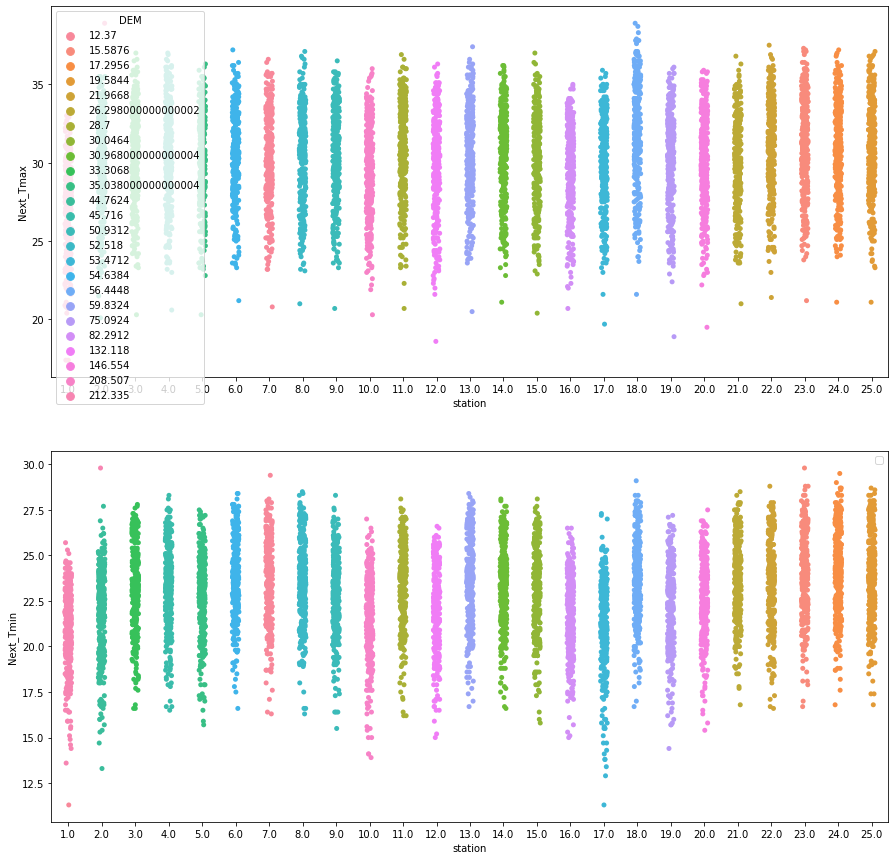

In [55]:
# Visualizing the relation between station and the target variables on the basis of longitude
plt.figure(figsize=(15,15))
plt.subplot(2,1,1)
sns.stripplot(df['station'],df["Next_Tmax"],data=df,hue=df["DEM"])
plt.subplot(2,1,2)
sns.stripplot(df['station'],df["Next_Tmin"],data=df,hue=df["DEM"])
plt.legend("")
plt.show()

- From the plot we can coclude that, each station belongs to a particular elevation and there is only one station belonging to particular elevation.
- The highest Tmax is noted at the station 18 which have the elevation 56.4448 and it is not lowest elevation. This indicates that elevation alone does not decide the temperature.

To know the more relation between the variables we will plot pair plot. 

## Multivariate Analysis

Since we have two target variables Next_Tmax and Next_Tmin, we will check the pairwise relation of the features with both the targets separately.

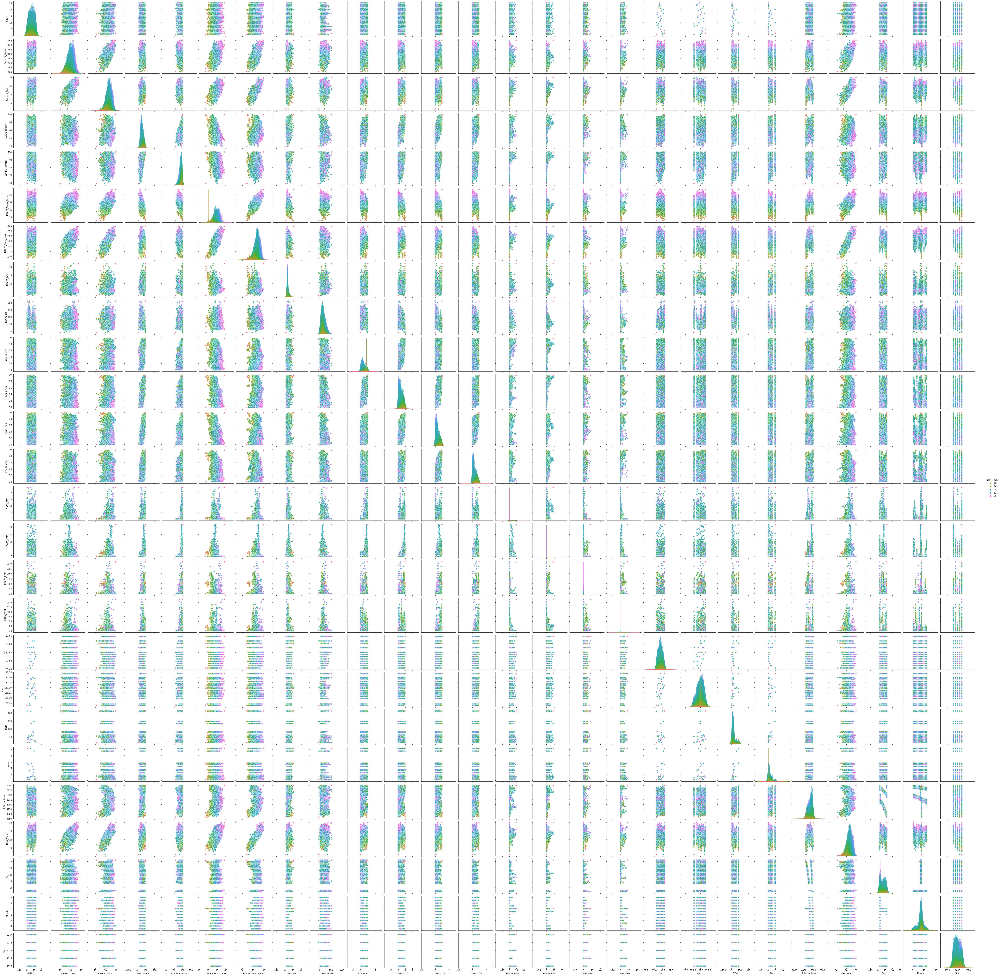

In [56]:
# Checking the pairwise relation between the features and label Next_Tmax.
sns.pairplot(df,hue="Next_Tmax",palette="husl")

- The pairplot gives the pairwise relation between the features on the basis of the targets Next_Tmax. On the diagonal we can notice the distribution plots in the pairplots.
- We can notice most of the feature have strong linear relationship with each other and also we can observe the presence of outliers in many columns. We will indentify the outliers using boxplots.

## Identifying the outliers

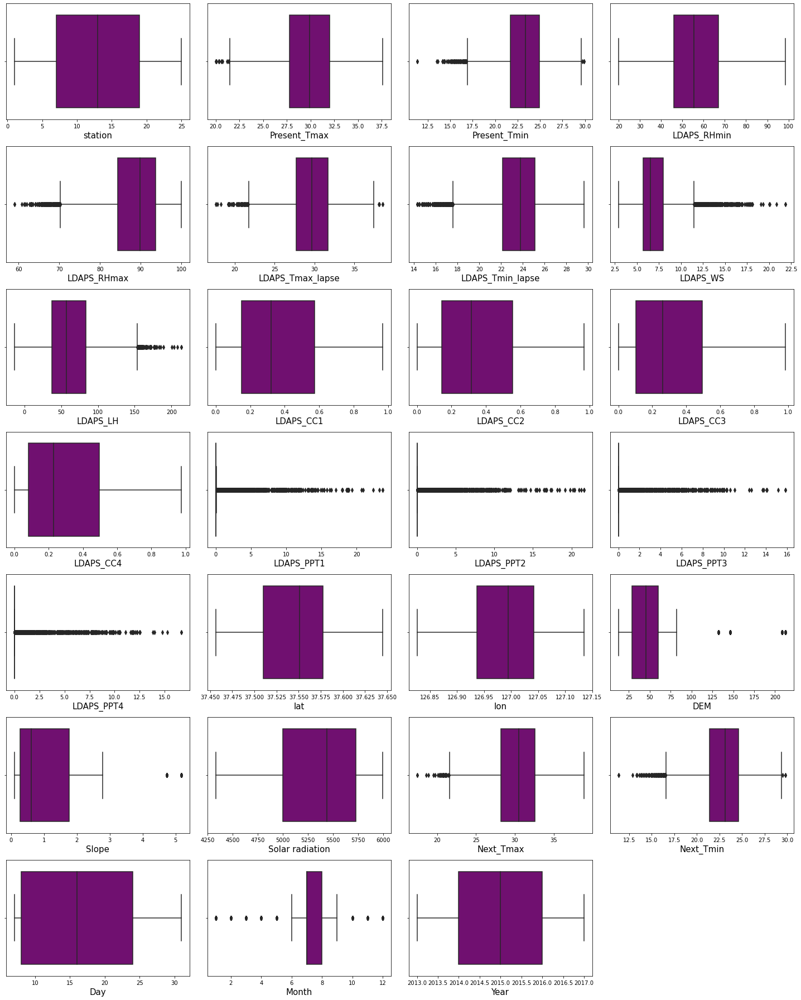

In [41]:
# Identifying the outlierspresent in numerical columns using boxplot

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in df.columns:
    if plotnumber<=27:
        ax=plt.subplot(7,4,plotnumber)
        sns.boxplot(df[column],color="purple")
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.tight_layout()

The outliers present in the following columns:
1.  Present_Tmax
2.  Present_Tmin
3.  LDAPS_RHmax
4. LDAPS_Tmax_lapse
5. LDAPS_Tmin_lapse
6.  LDAPS_WS
7.  LDAPS_LH
8. LDAPS_PPT1
9.  LDAPS_PPT2
10.  LDAPS_PPT3
11. LDAPS_PPT4
12. DEM
13. Slope
14.  Next_Tmax
15. Next_Tmin
15. Month



# Removing outliers
# 1. Zscore method

In [42]:
# Features containing outliers
features = df[['Present_Tmax','Present_Tmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope','Month']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z

array([[1.05933706, 1.52938967, 0.82616776, ..., 0.24365023, 0.37271473,
        0.41069088],
       [0.99168645, 0.6762959 , 0.5898995 , ..., 0.15470427, 0.40868856,
        2.71713086],
       [0.09072333, 0.44735524, 0.58428991, ..., 0.77904331, 0.71933797,
        0.41069088],
       ...,
       [0.05689802, 0.30174552, 0.13045665, ..., 0.56930896, 0.46633785,
        2.19801758],
       [1.54521147, 0.42659564, 1.09227318, ..., 0.31515742, 0.54215762,
        0.0361408 ],
       [0.72108401, 0.63467919, 0.50164251, ..., 1.56027695, 2.53405229,
        0.41069088]])

Now we have removed the outliers.

In [43]:
# Creating new dataframe
new_df = df[(z<3).all(axis=1)] 
new_df

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
993,19.0,32.9,26.9,70.292274,94.302246,30.944489,27.132763,8.309695,40.868304,0.430138,0.550322,0.260389,0.236143,0.549804,0.016756,0.000000,0.000000,37.5776,126.938,75.0924,1.7678,5248.685547,31.4,27.2,8,8,2013
2366,17.0,32.7,21.6,48.591167,84.166023,34.338918,25.333024,8.710489,147.656176,0.409164,0.299555,0.322919,0.482160,0.065084,0.000000,0.000000,0.271654,37.6181,127.099,53.4712,0.6970,5404.463867,34.0,24.2,8,1,2014
1774,25.0,29.5,24.3,48.306915,84.206177,35.288582,25.664152,5.956511,59.122170,0.577917,0.389382,0.434058,0.696693,0.000000,0.000000,0.752436,0.543365,37.5237,126.970,19.5844,0.2713,5795.938965,33.8,25.3,7,8,2014
4977,3.0,28.9,22.9,41.821899,83.570679,31.648350,23.924217,7.938771,29.712206,0.153490,0.138968,0.225796,0.121203,0.263700,0.000000,0.004096,0.000000,37.5776,127.058,33.3068,0.2661,5735.222656,32.1,23.6,13,7,2016
6006,7.0,32.0,27.2,62.234764,86.061272,29.648640,25.834683,4.839175,125.300368,0.352198,0.417417,0.257740,0.059068,0.000000,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,4671.159180,33.2,26.9,23,8,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4207,8.0,30.4,24.2,37.396782,87.255089,31.359974,23.272499,6.432915,53.060695,0.113527,0.061671,0.022780,0.040921,0.000000,0.000000,0.000000,0.000000,37.4697,126.910,52.5180,1.5629,5052.947754,32.9,24.5,13,8,2015
7089,15.0,33.3,25.8,36.554966,73.090355,37.438654,28.137417,6.772227,25.697615,0.015465,0.022138,0.003635,0.058769,0.000000,0.000000,0.000000,0.000000,37.5507,126.937,30.0464,0.8552,5330.428223,36.4,27.7,8,4,2017
6287,13.0,28.7,22.0,43.769032,92.208420,32.573196,23.175801,6.470117,69.864498,0.746611,0.159544,0.237722,0.134749,2.574207,0.000000,0.000000,0.000000,37.5776,127.083,59.8324,2.6865,5842.815430,32.8,24.0,7,3,2017
2638,14.0,29.6,22.5,62.489918,87.454720,27.170970,23.626957,4.646035,9.689729,0.325550,0.594588,0.650851,0.634073,0.000000,0.000394,0.000000,0.000000,37.4967,126.927,30.9680,0.6180,5086.431152,27.1,21.7,8,12,2014


This is the new dataframe after removing the outliers. Here we have removed the outliers whose Zscore is less than 3.

In [44]:
# Shape of original dataset
df.shape

(7752, 27)

Before removing the outliers we had 7752 rows and 27 columns in our dataset.

In [45]:
# Shape of new dataframe
new_df.shape

(6907, 27)

After removing the outliers we have 6907 rows and 27 columns.

In [46]:
# Checking the the data loss
data_loss = (7752-6907)/7752*100
data_loss

10.900412796697626

Here we are losing more than 10% of data. Let's check the data loss using IQR method and then we will decide whether to remove outliers or not.

# 2. IQR (Inter Quantile Range) method

In [47]:
# 1st quantile
Q1=features.quantile(0.25)

# 3rd quantile
Q3=features.quantile(0.75)

# IQR
IQR=Q3 - Q1

df1=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

We have removed the outliers using IQR method.

In [48]:
df1.shape

(2413, 27)

Using IQR method the dataframe has 2413 rows and 27 columns.

In [49]:
# Let's check the dataloss
data_loss = (7752-2413)/7752*100
data_loss

68.87254901960785

Using IQR method we are losing 68.87% of data.

By using both Zscore and IQR method we are losing more data, so I am not going to remove outliers since the outliers present in the data may have some strong relation with columns. If we try to remove the outliers, it will impact the other variables since it eliminates one complete row. That row may have other good test for other values. On this basis I am not going to remove the outliers in any of the columns and keeping my dataframe as it is.

## Correlation between the target variable and features using HEAT map

In [50]:
# Checking the correlation between features and the target
cor = df.corr()
cor

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
station,1.000000,0.112806,0.132122,-0.066731,-0.166334,0.069363,0.105053,0.004353,-0.133693,0.006769,0.003223,0.000442,0.005849,-0.004990,-0.010555,-0.015051,-0.013033,-0.237438,-0.118574,-0.256095,-0.090413,-0.018787,0.108289,0.128713,-0.000730,-0.000169,-0.000582
Present_Tmax,0.112806,1.000000,0.618760,-0.204571,-0.300322,0.570129,0.624216,-0.123582,0.134251,-0.311805,-0.213791,-0.145577,-0.142683,-0.111129,-0.101377,-0.122044,-0.101178,-0.052615,0.009020,-0.187121,-0.105809,-0.025439,0.610348,0.622741,-0.143899,-0.001185,0.059665
Present_Tmin,0.132122,0.618760,1.000000,0.123143,-0.012754,0.464151,0.764227,-0.037708,-0.011276,0.084447,0.090263,-0.005466,-0.047714,0.109121,0.064829,-0.049005,-0.065647,-0.078475,-0.043461,-0.250275,-0.146339,0.053578,0.471806,0.796670,-0.108728,-0.003550,0.036987
LDAPS_RHmin,-0.066731,-0.204571,0.123143,1.000000,0.579032,-0.564580,0.089471,0.294271,-0.070848,0.613818,0.745443,0.689513,0.513878,0.262547,0.390824,0.240576,0.168555,0.087099,-0.076237,0.102115,0.123744,0.244080,-0.437898,0.095019,-0.065735,-0.053922,-0.001984
LDAPS_RHmax,-0.166334,-0.300322,-0.012754,0.579032,1.000000,-0.373334,-0.113914,0.134786,0.238183,0.436570,0.391256,0.226434,0.130008,0.267698,0.228398,0.134087,0.117376,0.195761,0.025662,0.177134,0.219557,0.148259,-0.281341,-0.070246,-0.012803,-0.039040,-0.142223
LDAPS_Tmax_lapse,0.069363,0.570129,0.464151,-0.564580,-0.373334,1.000000,0.653985,-0.311900,0.048004,-0.438439,-0.523619,-0.541197,-0.429374,-0.111016,-0.242033,-0.188063,-0.160235,-0.042093,0.090666,-0.178895,-0.162332,0.047971,0.827189,0.586868,-0.160495,-0.021745,0.015978
LDAPS_Tmin_lapse,0.105053,0.624216,0.764227,0.089471,-0.113914,0.653985,1.000000,-0.130245,-0.134906,0.010900,0.047725,-0.044233,-0.080587,0.037727,0.000588,-0.088791,-0.094855,-0.096252,-0.026700,-0.195445,-0.185839,0.159445,0.588206,0.881059,-0.177770,-0.026990,-0.004937
LDAPS_WS,0.004353,-0.123582,-0.037708,0.294271,0.134786,-0.311900,-0.130245,1.000000,0.007115,0.289356,0.261010,0.243402,0.221066,0.153213,0.192427,0.162173,0.144550,0.036646,-0.059448,0.190995,0.171577,0.122966,-0.345619,-0.098767,-0.028982,-0.082375,-0.110409
LDAPS_LH,-0.133693,0.134251,-0.011276,-0.070848,0.238183,0.048004,-0.134906,0.007115,1.000000,-0.147276,-0.264245,-0.245130,-0.172222,-0.012042,-0.077061,0.016483,0.020332,0.133203,0.025819,0.055126,0.086770,-0.046553,0.155608,-0.056906,-0.012227,-0.023536,0.057462
LDAPS_CC1,0.006769,-0.311805,0.084447,0.613818,0.436570,-0.438439,0.010900,0.289356,-0.147276,1.000000,0.779683,0.517368,0.360908,0.446128,0.389310,0.168695,0.091700,-0.008131,-0.006843,-0.014090,-0.020752,0.218309,-0.452541,-0.011028,-0.019928,-0.076224,-0.066300


This gives the correlation between the denpendent and independent variables. We can visualize this by plotting heat map.



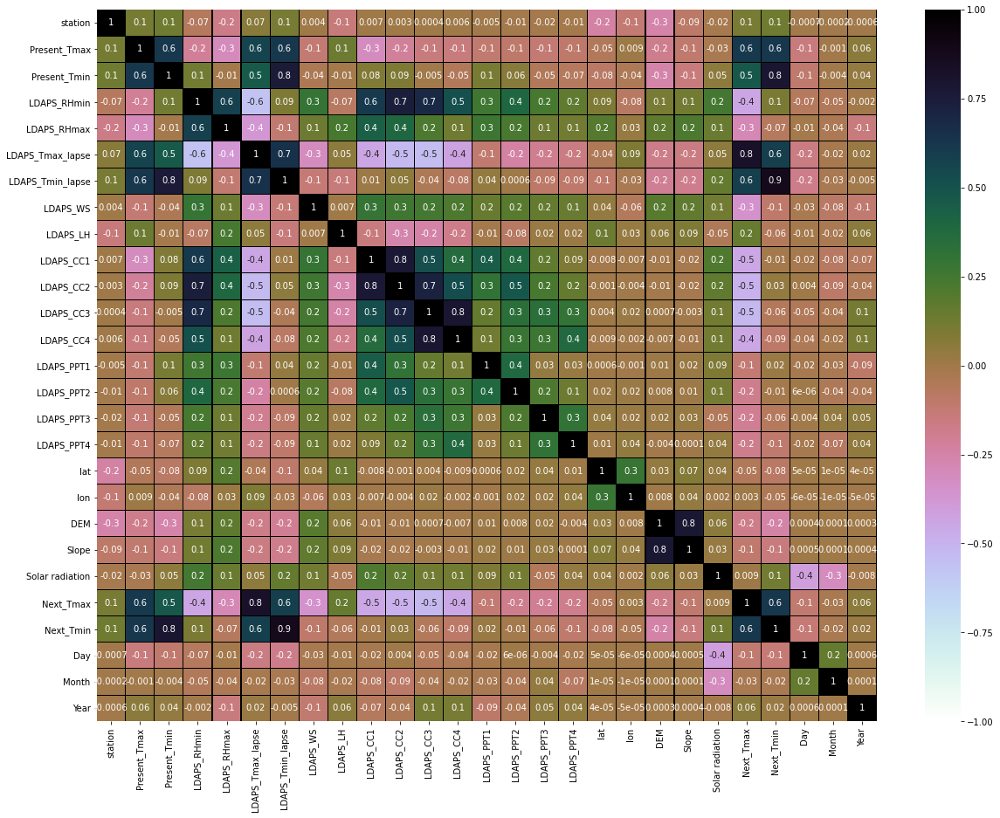

In [51]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':10},cmap="cubehelix_r")
plt.yticks(rotation=0);

# Correlation between Next_Tmax and features

1. The label Next_Tmax is highly positively correlated with LDAPS_Tmax_lapse, LDAPS_Tmin_lapse, Present_Tmax, Present_Tmin and Next_Tmin.
2. The label is negatively correlated with LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4, LDAPS_RHmax, LDAPS_RHmin, and LDAPS_WS.
3. The features lon and Solar radiations have very less correlation with the target Next_Tmin.

# Correlation between Next_Tmin and features
1.The label Next_Tmin is highly positively correlated with LDAPS_Tmin_lapse, Present_Tmin, LDAPS_Tmax_lapse, Present_Tmax and Next_Tmax.
2. The label is negatively correlated with DEM, Slope and Day.

From the heat map we can observe that most of the features are highly correlated with each other which leads to a multicollinearity problem. We will check VIF values and then drop the columns containing VIF less than 5 to get rid of multicollinearity issue.

# 1. Prediction for Next_Tmax

## Visualizing the correlation between label Next_Tmax and features using bar plot

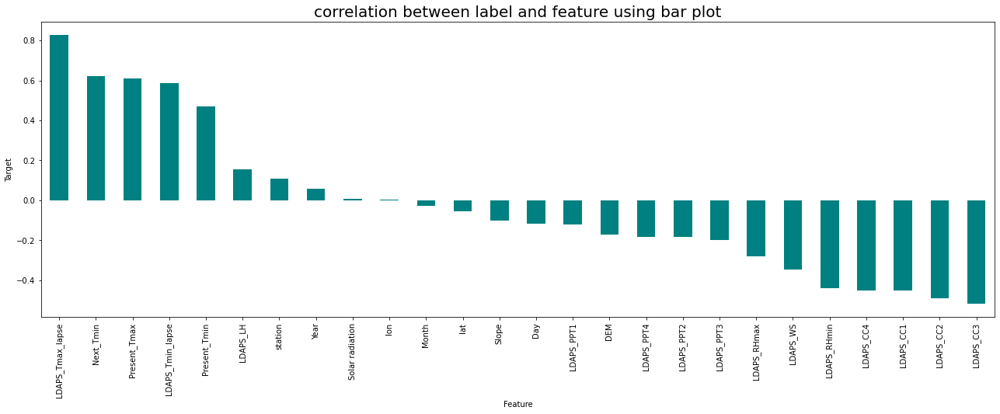

In [52]:
plt.figure(figsize=(22,7))
df.corr()['Next_Tmax'].sort_values(ascending=False).drop(['Next_Tmax']).plot(kind='bar',color='teal')
plt.xlabel('Feature',fontsize=10)
plt.ylabel('Target',fontsize=10)
plt.title('correlation between label and feature using bar plot',fontsize=20)
plt.show()

The columns longitude and Solar radiations have very less correlation with the label. We can drop this column if necessary.

## Separating the features and label variables into x and y

In [53]:
x = df.drop("Next_Tmax", axis=1)
y = df["Next_Tmax"]

We have separated independent and variables and stored in x and y respectively.

In [54]:
# Dimension of x
x.shape

(7752, 26)

In [55]:
# Dimension of y
y.shape

(7752,)

## Checking for skewness

In [56]:
# Checking the skewness
x.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.646670
LDAPS_CC4           0.673700
LDAPS_PPT1          5.395178
LDAPS_PPT2          5.776835
LDAPS_PPT3          6.458608
LDAPS_PPT4          6.826930
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmin          -0.404447
Day                 0.245283
Month              -0.705586
Year               -0.000365
dtype: float64

The following columns contains skewness greater than +0.5 and -0.5.
- LDAPS_RHmax
- LDAPS_Tmin_lapse
- LDAPS_WS
- LDAPS_LH
- LDAPS_CC3
- LDAPS_CC4
- LDAPS_PPT1
- LDAPS_PPT2
- LDAPS_PPT3
- LDAPS_PPT4
- DEM
- Slope
- Solar radiation
- Month 

We will remove the skewness using yeo_johnson method.

## Removing skewness using yeo-johnson method

In [57]:
# Making the skew less than or equal to +0.5 and -0.5 for better prediction using yeo-johnson method
skew=['LDAPS_RHmax','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope','Solar radiation','Month']

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [58]:
x[skew] = scaler.fit_transform(x[skew].values)
x[skew].head()

,LDAPS_RHmax,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation,Month
993,0.860551,1.750897,0.790765,-0.576372,-0.041140,-0.028703,1.688811,-0.302846,-0.492283,-0.444377,0.724774,0.902752,-0.373527,0.363879
2366,-0.752874,0.773136,0.942035,2.181373,0.230809,0.884442,0.036834,-0.519114,-0.492283,2.216902,0.295241,-0.076631,0.003654,-2.270338
1774,-0.747894,0.943807,-0.432936,0.011783,0.648551,1.414414,-0.557339,-0.519114,2.501226,2.592469,-1.193124,-0.935044,1.150616,0.363879
4977,-0.825556,0.091818,0.639154,-0.988340,-0.205132,-0.638132,1.079675,-0.519114,-0.406422,-0.444377,-0.364575,-0.949164,0.952504,-0.126054
6006,-0.506792,1.033301,-1.343505,1.699622,-0.053337,-1.039701,-0.557339,-0.519114,-0.492283,-0.444377,-1.985144,-1.477171,-1.448040,0.363879


In [59]:
# Checking skewness after using yeo-johnson method
x.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.116482
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.018120
LDAPS_WS            0.002449
LDAPS_LH            0.058865
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.089672
LDAPS_CC4           0.129826
LDAPS_PPT1          1.463941
LDAPS_PPT2          1.646417
LDAPS_PPT3          1.824919
LDAPS_PPT4          2.059400
lat                 0.087062
lon                -0.285213
DEM                 0.039456
Slope               0.233968
Solar radiation    -0.176636
Next_Tmin          -0.404447
Day                 0.245283
Month               0.043780
Year               -0.000365
dtype: float64

I have used all the methods like cube root, square root, log and log1p transformations and yeo-johnson methods but the skewness is not reducing in LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3 and LDAPS_PPT4 . This is because these columns may have some extreme test level. So keeping the skewness in those columns as it is and moving further. 

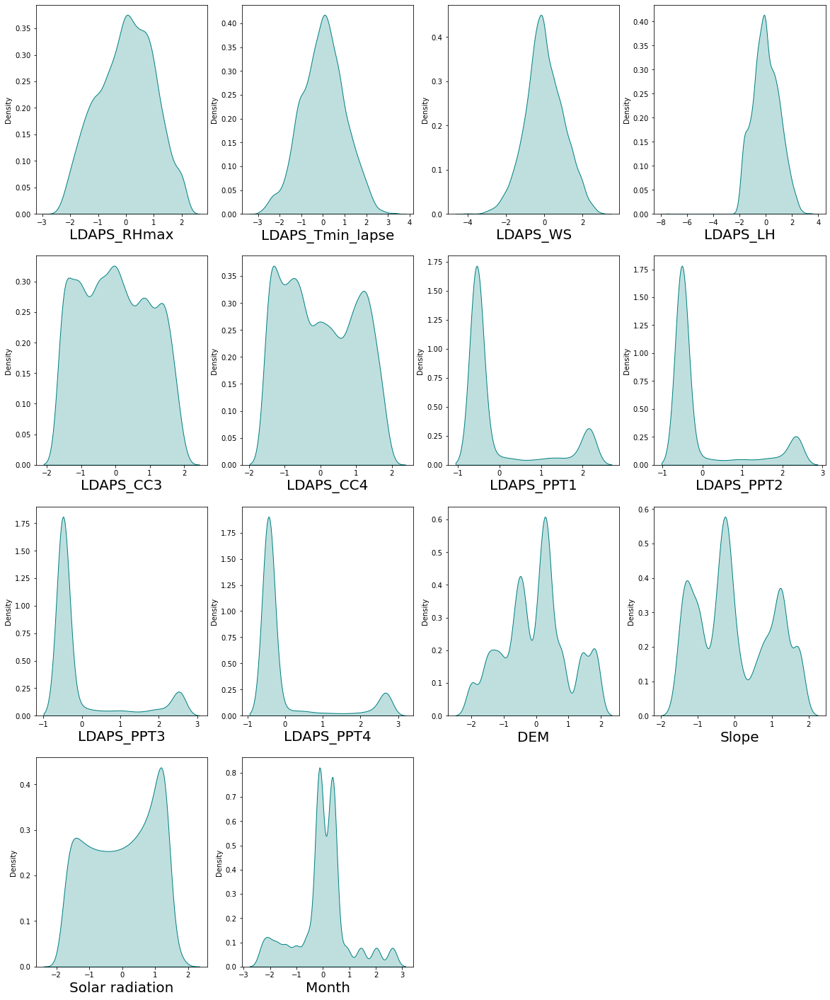

In [60]:
# After removing skewness let's check how the data has been distributed in each column.

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in x[skew]:
    if plotnumber<=14:
        ax = plt.subplot(4,4,plotnumber)
        sns.distplot(x[column],color='teal',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

After removing the skewness the data looks almost normal compared to old data. The skewness has been removed in all the columns and the skewness is reduced in the columns LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3 and LDAPS_PPT4.

Since the precipitation columns have skewness and are not in normal, so we will use MinMaxScaler to scale the data.

## Feature Scaling using MinMaxScaler

In [61]:
from sklearn.preprocessing import MinMaxScaler

mms=MinMaxScaler()
x = pd.DataFrame(mms.fit_transform(x), columns=x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Day,Month,Year
0,0.750000,0.732955,0.838710,0.641402,0.720436,0.636771,0.748082,0.688166,0.630561,0.444690,0.568307,0.437622,0.430972,0.814963,0.074580,0.000000,0.000000,0.643008,0.362460,0.709380,0.739267,0.405070,0.859459,0.041667,0.537778,0.00
1,0.666667,0.721591,0.553763,0.365762,0.369639,0.799050,0.590396,0.709294,0.883513,0.423006,0.309345,0.514106,0.701802,0.215582,0.000000,0.000000,0.846680,0.857521,0.883495,0.596941,0.435057,0.506015,0.697297,0.041667,0.000000,0.25
2,1.000000,0.539773,0.698925,0.362152,0.370722,0.844451,0.617920,0.517247,0.684509,0.597467,0.402108,0.631593,0.858987,0.000000,0.000000,0.980015,0.966165,0.357521,0.466019,0.207329,0.168421,0.812976,0.756757,0.000000,0.537778,0.25
3,0.083333,0.505682,0.623656,0.279782,0.353837,0.670421,0.480518,0.666990,0.592774,0.158682,0.143509,0.391501,0.250222,0.593952,0.000000,0.028109,0.000000,0.643008,0.750809,0.424219,0.164035,0.759955,0.664865,0.250000,0.437757,0.75
4,0.250000,0.681818,0.854839,0.539058,0.423143,0.574820,0.632353,0.390065,0.839325,0.364113,0.431059,0.434192,0.131120,0.000000,0.000000,0.000000,0.000000,0.643008,0.038835,0.000000,0.000029,0.117498,0.843243,0.666667,0.537778,0.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,0.583333,0.755682,0.779570,0.212883,0.142415,0.947240,0.844964,0.587766,0.577854,0.015988,0.022861,0.007895,0.130503,0.000000,0.000000,0.000000,0.000000,0.500530,0.359223,0.384076,0.502515,0.456651,0.886486,0.041667,0.180410,1.00
7748,0.500000,0.494318,0.575269,0.304513,0.633956,0.714635,0.426767,0.563378,0.713142,0.771869,0.164759,0.407731,0.273982,0.992595,0.000000,0.000000,0.000000,0.643008,0.831715,0.635190,0.857810,0.855370,0.686486,0.000000,0.110595,1.00
7749,0.541667,0.545455,0.602151,0.542299,0.465738,0.456369,0.458793,0.363185,0.505842,0.336563,0.614020,0.810054,0.818545,0.000000,0.001837,0.000000,0.000000,0.214513,0.326861,0.395945,0.396343,0.311278,0.562162,0.041667,1.000000,0.25
7750,0.041667,0.295455,0.586022,0.893743,0.806375,0.403865,0.513752,0.755502,0.635050,0.945568,0.841526,0.955258,0.857296,0.999985,0.967456,0.998672,0.000000,0.786017,0.666667,0.534308,0.339168,0.776056,0.648649,0.250000,0.437757,0.00


We have scaled the data using MinMaxScalar method to overcome with the issue of data biasness.

As we have observed in the heat map there is multicollinearity issue exists in the data, So let's check the VIF value and if the columns have VIF greater than 10 then we can drop those columns.

## Checking VIF(Variance Inflation Factor) values

In [62]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,4.535428,station
1,34.326786,Present_Tmax
2,87.573461,Present_Tmin
3,46.304936,LDAPS_RHmin
4,18.931768,LDAPS_RHmax
5,91.235501,LDAPS_Tmax_lapse
6,65.391858,LDAPS_Tmin_lapse
7,20.706292,LDAPS_WS
8,64.171809,LDAPS_LH
9,15.196003,LDAPS_CC1


The column Next_Tmin has VIF value greater than 10, we will remove this to overcome with the issue of multicollinearity. After dropping the column will check VIF again, if we find the value above 10 then we will remove that column having high VIF. This process will continue until we get the VIF value less than 10.

In [63]:
# Dropping Next_Tmin column
x.drop("Next_Tmin",axis=1,inplace=True)

In [64]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,4.534770,station
1,33.775211,Present_Tmax
2,77.650831,Present_Tmin
3,44.961529,LDAPS_RHmin
4,18.750714,LDAPS_RHmax
5,85.634324,LDAPS_Tmax_lapse
6,53.842796,LDAPS_Tmin_lapse
7,20.441734,LDAPS_WS
8,64.094992,LDAPS_LH
9,15.191476,LDAPS_CC1


The column LDAPS_Tmax_lapse has High VIF value compare to other columns. Let's drop it.

In [65]:
# Dropping LDAPS_Tmax_lapse column
x.drop("LDAPS_Tmax_lapse",axis=1,inplace=True)

In [66]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,4.448455,station
1,33.514842,Present_Tmax
2,74.270762,Present_Tmin
3,32.144165,LDAPS_RHmin
4,18.587647,LDAPS_RHmax
5,29.540905,LDAPS_Tmin_lapse
6,20.406185,LDAPS_WS
7,50.196247,LDAPS_LH
8,15.077095,LDAPS_CC1
9,17.526319,LDAPS_CC2


After removing two columns also we are getting VIF value high in Present_Tmin. We will drop this column.

In [67]:
# Dropping Present_Tmin column
x.drop("Present_Tmin",axis=1,inplace=True)

In [68]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,4.422332,station
1,29.139375,Present_Tmax
2,32.124332,LDAPS_RHmin
3,18.146944,LDAPS_RHmax
4,20.074249,LDAPS_Tmin_lapse
5,19.820953,LDAPS_WS
6,48.036007,LDAPS_LH
7,14.853205,LDAPS_CC1
8,17.525836,LDAPS_CC2
9,17.701459,LDAPS_CC3


The VIF is high in LDAPS_LH, remove that column.

In [69]:
# Dropping LDAPS_LH column
x.drop("LDAPS_LH",axis=1,inplace=True)

In [70]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,4.357750,station
1,22.420439,Present_Tmax
2,31.898138,LDAPS_RHmin
3,15.012202,LDAPS_RHmax
4,19.565807,LDAPS_Tmin_lapse
5,17.942441,LDAPS_WS
6,14.506970,LDAPS_CC1
7,16.963098,LDAPS_CC2
8,17.584827,LDAPS_CC3
9,9.659758,LDAPS_CC4


LDAPS_RHmin has high VIF, let's drop it.

In [71]:
# Dropping LDAPS_RHmin column
x.drop("LDAPS_RHmin",axis=1,inplace=True)

In [72]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,4.353489,station
1,21.959436,Present_Tmax
2,10.499716,LDAPS_RHmax
3,17.943621,LDAPS_Tmin_lapse
4,17.494162,LDAPS_WS
5,14.424490,LDAPS_CC1
6,15.972219,LDAPS_CC2
7,15.747872,LDAPS_CC3
8,9.644795,LDAPS_CC4
9,3.300489,LDAPS_PPT1


We can find the VIF value high in Present_Tmax compared to others. Let's remove that column.


In [73]:
# Dropping Present_Tmax column
x.drop("Present_Tmax",axis=1,inplace=True)

In [74]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,4.249027,station
1,10.494177,LDAPS_RHmax
2,8.455902,LDAPS_Tmin_lapse
3,16.864879,LDAPS_WS
4,13.559921,LDAPS_CC1
5,15.963881,LDAPS_CC2
6,15.656609,LDAPS_CC3
7,9.638630,LDAPS_CC4
8,3.270818,LDAPS_PPT1
9,2.956593,LDAPS_PPT2


In [75]:
# Removing the column LDAPS_WS which has VIF greater than 10.
x.drop("LDAPS_WS",axis=1,inplace=True)

In [76]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,3.968764,station
1,10.436610,LDAPS_RHmax
2,7.862778,LDAPS_Tmin_lapse
3,13.491842,LDAPS_CC1
4,15.963879,LDAPS_CC2
5,15.636448,LDAPS_CC3
6,9.616443,LDAPS_CC4
7,3.269027,LDAPS_PPT1
8,2.955624,LDAPS_PPT2
9,2.200587,LDAPS_PPT3


In [77]:
# Removing LDAPS_CC2 column which has VIF above 10.
x.drop("LDAPS_CC2",axis=1,inplace=True)

In [78]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,3.968088,station
1,10.275046,LDAPS_RHmax
2,7.779405,LDAPS_Tmin_lapse
3,9.312590,LDAPS_CC1
4,12.846864,LDAPS_CC3
5,9.616340,LDAPS_CC4
6,3.072742,LDAPS_PPT1
7,2.322113,LDAPS_PPT2
8,2.199760,LDAPS_PPT3
9,2.027317,LDAPS_PPT4


The column DEM has high VIF compared to others. Let's remove that column.

In [79]:
# Dropping DEM column
x.drop("DEM",axis=1,inplace=True)

In [80]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,3.680109,station
1,10.128386,LDAPS_RHmax
2,7.716922,LDAPS_Tmin_lapse
3,9.311825,LDAPS_CC1
4,12.843669,LDAPS_CC3
5,9.614301,LDAPS_CC4
6,3.068458,LDAPS_PPT1
7,2.318813,LDAPS_PPT2
8,2.199743,LDAPS_PPT3
9,2.027274,LDAPS_PPT4


In [81]:
# Dropping LDAPS_CC3 column which has high VIF value
x.drop("LDAPS_CC3",axis=1,inplace=True)

In [82]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,3.680031,station
1,10.128315,LDAPS_RHmax
2,7.687641,LDAPS_Tmin_lapse
3,8.363750,LDAPS_CC1
4,5.068478,LDAPS_CC4
5,2.973010,LDAPS_PPT1
6,2.303686,LDAPS_PPT2
7,1.977942,LDAPS_PPT3
8,2.015596,LDAPS_PPT4
9,4.878332,lat


In [83]:
# Removing the column LDAPS_RHmax which has VIF above 10
x.drop("LDAPS_RHmax",axis=1,inplace=True)

In [84]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,3.680020,station
1,7.637569,LDAPS_Tmin_lapse
2,7.980586,LDAPS_CC1
3,5.057435,LDAPS_CC4
4,2.931576,LDAPS_PPT1
5,2.282662,LDAPS_PPT2
6,1.967399,LDAPS_PPT3
7,2.010568,LDAPS_PPT4
8,4.437019,lat
9,5.551137,lon


Finally we are getting the VIF value less than 10 in all the columns which means our data is free from multicollinearity problem.

In [85]:
# Checking dataframe after removing the columns
x.head()

,station,LDAPS_Tmin_lapse,LDAPS_CC1,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,Slope,Solar radiation,Day,Month,Year
0,0.750000,0.748082,0.444690,0.430972,0.814963,0.07458,0.000000,0.000000,0.643008,0.362460,0.739267,0.405070,0.041667,0.537778,0.00
1,0.666667,0.590396,0.423006,0.701802,0.215582,0.00000,0.000000,0.846680,0.857521,0.883495,0.435057,0.506015,0.041667,0.000000,0.25
2,1.000000,0.617920,0.597467,0.858987,0.000000,0.00000,0.980015,0.966165,0.357521,0.466019,0.168421,0.812976,0.000000,0.537778,0.25
3,0.083333,0.480518,0.158682,0.250222,0.593952,0.00000,0.028109,0.000000,0.643008,0.750809,0.164035,0.759955,0.250000,0.437757,0.75
4,0.250000,0.632353,0.364113,0.131120,0.000000,0.00000,0.000000,0.000000,0.643008,0.038835,0.000029,0.117498,0.666667,0.537778,0.75


In [86]:
x.shape

(7752, 15)

After removing the colums containing VIF above 10, the dataframe contains 15 columns. We have done all the preprocessing and data cleaning, now our dataset is ready for building the machine learning models. 

# Modeling

# Finding best random state

In [88]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [89]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.9132806441335138  on Random_state  153


The maximum r2 score is 91.32 at random state 153

## Feature Importance

,Importance
Features,
LDAPS_Tmin_lapse,0.352
LDAPS_CC1,0.197
LDAPS_CC4,0.112
LDAPS_PPT2,0.069
Solar radiation,0.061
Year,0.042
Day,0.035
LDAPS_PPT3,0.031
Month,0.030


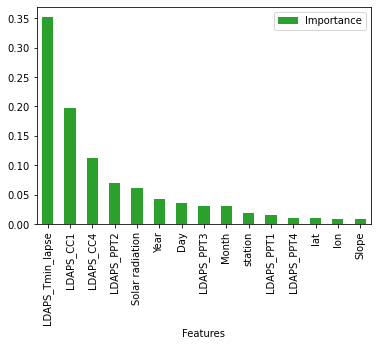

In [91]:
# Lets ckeck the feature importance using Random Forest Regressor

RFR = RandomForestRegressor()
RFR.fit(x_train, y_train)
importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(RFR.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances.plot.bar(color='tab:green')
importances

With the help of Random Forest Regressor we are able to list down the importance or priority given to a feature as per it's involvement or weightage in predicting our label.

## Creating new train test split

In [92]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

Here we have created new test train split.

# Regression Algorithms

In [93]:
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
import xgboost as xgb
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import metrics

## Random Forest Regressor

R2_Score: 0.9140780928819927
MAE: 0.6933884933786354
MSE: 0.8608879645543595
RMSE: 0.9278404844338058


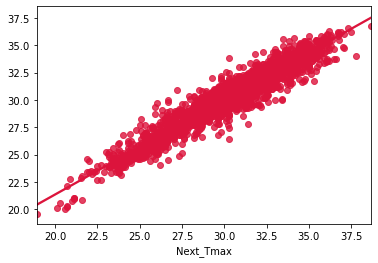

In [103]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
rf=r2_score(y_test,predRFR)
print('R2_Score:',rf)
print('MAE:',metrics.mean_absolute_error(y_test, predRFR))
print('MSE:',metrics.mean_squared_error(y_test, predRFR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predRFR)))

# Visualizing the predicted values
sns.regplot(y_test,predRFR,color="crimson")
plt.show()

We have created Random Forest Regressor and checked the evaluation metrics. The predicted R2 score for Random Forest Regressor is 91.40%. 

## Decision Tree Regressor

R2_Score: 0.8007983525953308
MAE: 1.006997136631911
MSE: 1.995885642232684
RMSE: 1.4127581683475356


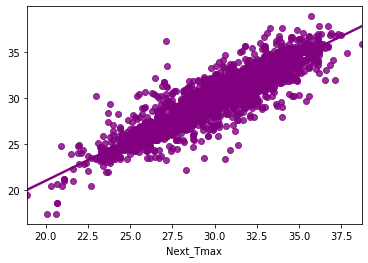

In [95]:
# Checking R2 score for Decision Tree Regressor
DTR=DecisionTreeRegressor()
DTR.fit(x_train,y_train)

# prediction
predDTR=DTR.predict(x_test)
dt=r2_score(y_test,predDTR)
print('R2_Score:',dt)
print('MAE:',metrics.mean_absolute_error(y_test, predDTR))
print('MSE:',metrics.mean_squared_error(y_test, predDTR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predDTR)))

# Visualizing the predicteed values
sns.regplot(y_test,predDTR,color="purple")
plt.show()

We have created Decision Tree Regressor and checked the evaluation metrics. The predicted R2 score for Decision Tree Regressor is 80.07%.

## GradientBoosting Regressor

R2_Score: 0.8040211050234946
MAE: 1.0824407843933896
MSE: 1.9635955212239167
RMSE: 1.4012835263514363


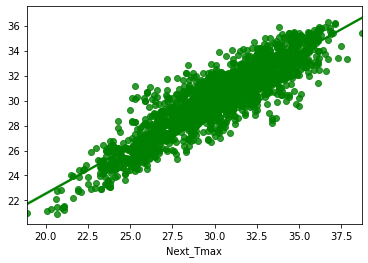

In [96]:
# Checking R2 score for GradientBoosting Regressor
GB=GradientBoostingRegressor()
GB.fit(x_train,y_train)

# prediction
predGB=GB.predict(x_test)
gbr=r2_score(y_test,predGB)
print('R2_Score:',gbr)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predGB))
print('MSE:',metrics.mean_squared_error(y_test, predGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predGB)))

# Visualizing the predicted values
sns.regplot(y_test,predGB,color="green")
plt.show()

We have created Gradient Boosting Regressor and checked the evaluation metrics. The predicted R2 score for Gradient Boosting Regressor is 80.40%.

## BaggingRegressor

R2_Score: 0.8989657803995122
MAE: 0.7566798203507833
MSE: 1.0123046214831195
RMSE: 1.0061335008253722


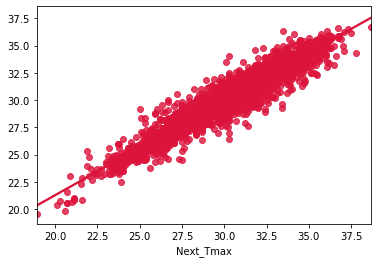

In [97]:
# Checking R2 score for BaggingRegressor

BR=BaggingRegressor()
BR.fit(x_train,y_train)

# prediction
predBR=BR.predict(x_test)
bgr=r2_score(y_test,predBR)
print('R2_Score:',bgr)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predBR))
print('MSE:',metrics.mean_squared_error(y_test, predBR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predBR)))

# Visualizing the predicted values
sns.regplot(y_test,predBR,color="crimson")
plt.show()

We have created Bagging Regressor and checked the evaluation metrics. The predicted R2 score for Bagging Regressor is 89.89%.

## XGB Regressor

R2_Score: 0.9213354617631698
MAE: 0.6754208988704665
MSE: 0.7881733131493824
RMSE: 0.8877912553913687


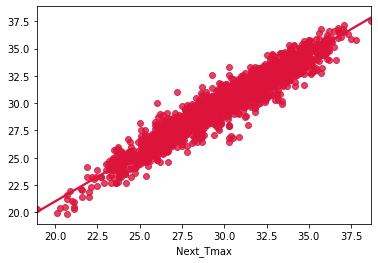

In [101]:
# Checking R2 score for XGB Regressor
from xgboost import XGBRegressor as xgb

XGB=xgb()
XGB.fit(x_train,y_train)

# prediction
predXGB=XGB.predict(x_test)
xgb1=r2_score(y_test,predXGB)
print('R2_Score:',xgb1)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predXGB))
print('MSE:',metrics.mean_squared_error(y_test, predXGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predXGB)))

# Visualizing the predicted values
sns.regplot(y_test,predXGB,color="crimson")
plt.show()

We have created XGB Regressor and checked the evaluation metrics. The predicted R2 score for XGB Regressor is 92.13%.

# ExtraTrees Regressor

R2_Score: 0.9250632576945025
MAE: 0.6475447731706029
MSE: 0.7508229474598572
RMSE: 0.8665004024579892


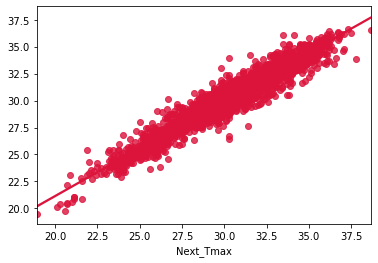

In [102]:
# Checking R2 score for Extra Trees Regressor

XT=ExtraTreesRegressor()
XT.fit(x_train,y_train)

# prediction
predXT=XT.predict(x_test)
etr=r2_score(y_test,predXT)
print('R2_Score:',etr)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predXT))
print('MSE:',metrics.mean_squared_error(y_test, predXT))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predXT)))

# Visualizing the predicted values
sns.regplot(y_test,predXT,color="crimson")
plt.show()

We have created Extra Trees Regressor and checked the evaluation metrics. The predicted R2 score for Extra Trees Regressor is 92.50%.

# Checking the cross validation score

In [104]:
from sklearn.model_selection import cross_val_score

In [105]:
# Checking cv score for Random Forest Regressor
rf_cv=cross_val_score(RFR,x,y,cv=5).mean()
print(rf_cv)


0.9067425842293089


In [106]:
# Checking cv score for Decision Tree Regressor
dt_cv=cross_val_score(DTR,x,y,cv=5).mean()
print(dt_cv)


0.7908378461455355


In [107]:
# Checking cv score for Gradient Boosting Regressor
gb_cv=cross_val_score(GB,x,y,cv=5).mean()
print(gb_cv)

0.7992506821237754


In [108]:
# Checking cv score for Bagging Regressor
br_cv=cross_val_score(BR,x,y,cv=5).mean()
print(br_cv)

0.8926240515393387


In [114]:
# Checking cv score for XGBRegressor
xgb_cv=cross_val_score(XGB,x,y,cv=5).mean()
print(xgb_cv)

0.9165079355801906


In [109]:
# Checking cv score for ExtraTreesRegressor
et_cv=cross_val_score(XT,x,y,cv=5).mean()
print(et_cv)

0.9159492344533602


In [110]:
regressor=['Random Forest Regressor','Decision Tree Regressor','Gradient Boosting Regressor','Bagging Regressor','XGB Regressor','Extra Tree Regressor']

In [112]:
accuracyscore=[rf,dt,gbr,bgr,xgb1,etr]

In [115]:
crossval=[rf_cv,dt_cv,gb_cv,br_cv,xgb_cv,et_cv]

In [116]:
models=pd.DataFrame({})
models['Regressor']=regressor
models['Accuracy_score']=accuracyscore
models['crossval']=crossval

In [117]:
models

,Regressor,Accuracy_score,crossval
0,Random Forest Regressor,0.914078,0.906743
1,Decision Tree Regressor,0.800798,0.790838
2,Gradient Boosting Regressor,0.804021,0.799251
3,Bagging Regressor,0.898966,0.892624
4,XGB Regressor,0.921335,0.916508
5,Extra Tree Regressor,0.925063,0.915949


Above are the cross validation score for the models that we have used.

From the differences between the R2 score and Cross Validation Scorei.e. 0.48 we can conclude that XGB Regressor as our best fitting model. We will perform Hyper parameter tuning on the best model.

# Hyper parameter tuning

In [118]:
from sklearn.model_selection import GridSearchCV

In [119]:
#XGB Regressor

parameters = {'n_estimators' : [50,100,150,200],
              'learning_rate':np.arange(0.05,0.5,0.05),
              'gamma' : np.arange(0,0.5,0.1),
              'max_depth' : [4, 6, 8,10]}

These are the parameter for XGB Regressor.

In [120]:
GCV=GridSearchCV(xgb(),parameters,cv=5)

Running GridSearchCV for XGB Regressor.

In [121]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, random_state=None,
                                    reg_alpha=None, reg_lambda=None,
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_para

In [122]:
GCV.best_params_

{'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 8, 'n_estimators': 200}

These are the best parameters.

R2_Score: 93.10662705818125
RMSE value: 0.8310693231131189
MAE: 0.6327909874690573
MSE: 0.6906762198196975


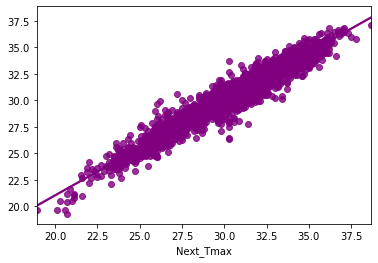

In [123]:
Final_model1 = xgb(gamma=0.1, learning_rate=0.1, max_depth=8, n_estimators=200)
Final_model1.fit(x_train, y_train)
pred = Final_model1.predict(x_test)
print('R2_Score:',r2_score(y_test,pred)*100)
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('MAE:',metrics.mean_absolute_error(y_test, pred))
print('MSE:',metrics.mean_squared_error(y_test, pred))

# Visualizing the predicted values
sns.regplot(y_test,pred,color="purple")
plt.show()

Great!!!...After hyper parameter tuning our best model accuracy increased by 2% and giving 93.10% which is very good.

## Saving the model

In [124]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_model1,"TemperatureForecastNextTmax.pkl")

['TemperatureForecastNextTmax.pkl']

We are saving the model using joblib library.

## Predicting the saved model

In [125]:
# Loading the saved model
Model1=joblib.load("TemperatureForecastNextTmax.pkl")

#Prediction
prediction_Tmax = Model1.predict(x_test)
prediction_Tmax

array([28.809782, 25.035725, 27.432203, ..., 28.024473, 35.98133 ,
       32.460754], dtype=float32)

 Here we have loaded our saved model of predictioon for Next_Tmax and got the predicted next day maximum temperature values which are displayes above.

In [126]:
Data=pd.DataFrame([Model1.predict(x_test)[:],y_test[:]],index=["Predicted","Actual"]).T
Data

,Predicted,Actual
0,28.809782,27.3
1,25.035725,24.8
2,27.432203,27.9
3,29.270329,28.5
4,30.484695,28.9
...,...,...
2321,33.998405,34.9
2322,29.860502,31.0
2323,28.024473,29.6
2324,35.981331,36.1


We have created a DataFrame of Actual and Predicted temperature values . Here Actual Next_Tmax and predicted Next_Tmax temperature values are almost same. 

Let's do the prediction for Next_Tmin variable. For this we will perform same steps that we have done for Next_Tmax.

# 2. Prediction for Next_Tmin

# Visualizing the correlation between label Next_Tmin and features using bar plot

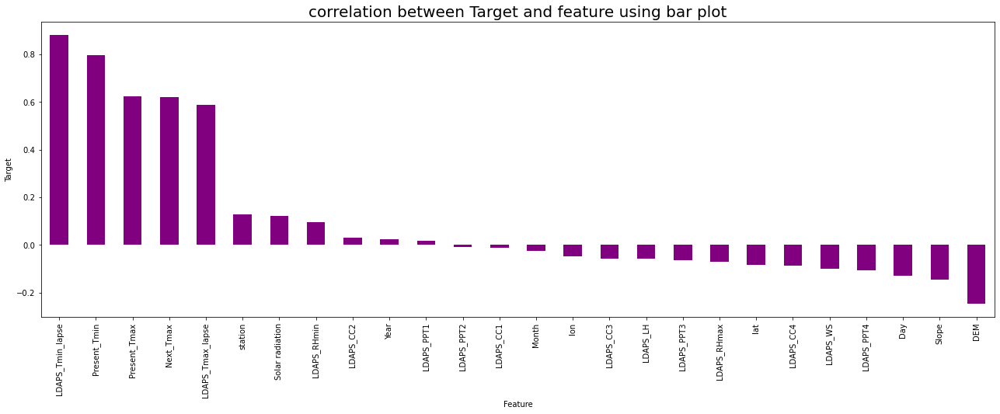

In [127]:
plt.figure(figsize=(22,7))
df.corr()['Next_Tmin'].sort_values(ascending=False).drop(['Next_Tmin']).plot(kind='bar',color='purple')
plt.xlabel('Feature',fontsize=10)
plt.ylabel('Target',fontsize=10)
plt.title('correlation between Target and feature using bar plot',fontsize=20)
plt.show()

This is the bar plot for Next_Tmin variable. Here the features LDAPS_PPT2 and LDAPS_CCC1 have very less correlated with the target. If necessary then we can drop them.

# Separating the features and label variables into X and Y

In [128]:
X = df.drop("Next_Tmin", axis=1)
Y = df["Next_Tmin"]

We have separated dependent and independent variables and stored them in Y and X columns respectively.

In [129]:
# Dimension of X
X.shape

(7752, 26)

In [130]:
# Dimension of Y
Y.shape

(7752,)

## Checking for skewness

In [131]:
X.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.646670
LDAPS_CC4           0.673700
LDAPS_PPT1          5.395178
LDAPS_PPT2          5.776835
LDAPS_PPT3          6.458608
LDAPS_PPT4          6.826930
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340200
Day                 0.245283
Month              -0.705586
Year               -0.000365
dtype: float64

The following columns contains skewness greater than +0.5 and -0.5.
1. LDAPS_RHmax
2. LDAPS_Tmin_lapse
3. LDAPS_WS
4. LDAPS_LH
5. LDAPS_CC3
6. LDAPS_CC4
7. LDAPS_PPT1
8. LDAPS_PPT2
9. LDAPS_PPT3
10. LDAPS_PPT4
11.  DEM
12. Slope
13. Solar radiation
14. Month 


## Removing skewness using yeo-johnson method

In [132]:
# Making the skew less than or equal to +0.5 and -0.5 for better prediction using yeo-johnson method
skew=['LDAPS_RHmax','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_CC3','LDAPS_CC4','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope','Solar radiation','Month']

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [133]:
X[skew] = scaler.fit_transform(X[skew].values)
X[skew].head()

,LDAPS_RHmax,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation,Month
993,0.860551,1.750897,0.790765,-0.576372,-0.041140,-0.028703,1.688811,-0.302846,-0.492283,-0.444377,0.724774,0.902752,-0.373527,0.363879
2366,-0.752874,0.773136,0.942035,2.181373,0.230809,0.884442,0.036834,-0.519114,-0.492283,2.216902,0.295241,-0.076631,0.003654,-2.270338
1774,-0.747894,0.943807,-0.432936,0.011783,0.648551,1.414414,-0.557339,-0.519114,2.501226,2.592469,-1.193124,-0.935044,1.150616,0.363879
4977,-0.825556,0.091818,0.639154,-0.988340,-0.205132,-0.638132,1.079675,-0.519114,-0.406422,-0.444377,-0.364575,-0.949164,0.952504,-0.126054
6006,-0.506792,1.033301,-1.343505,1.699622,-0.053337,-1.039701,-0.557339,-0.519114,-0.492283,-0.444377,-1.985144,-1.477171,-1.448040,0.363879


In [153]:
# Checking skewness after using yeo-johnson method
X.skew()

station             0.000182
Present_Tmax       -0.264137
Present_Tmin       -0.367538
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.116481
LDAPS_Tmax_lapse   -0.227880
LDAPS_Tmin_lapse   -0.018120
LDAPS_WS            0.002449
LDAPS_LH            0.058865
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.089672
LDAPS_CC4           0.129826
LDAPS_PPT1          1.463941
LDAPS_PPT2          1.646417
LDAPS_PPT3          1.824919
LDAPS_PPT4          2.059400
lat                 0.087062
lon                -0.285213
DEM                 0.039456
Slope               0.233968
Solar radiation    -0.176636
Next_Tmax          -0.340200
Day                 0.245283
Month               0.043780
Year               -0.000365
dtype: float64

We have removed the skewness in all the columns except LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3 and LDAPS_PPT4. This is because these columns may have some extreme test level. So keeping the skewness in those columns as it is and moving further.

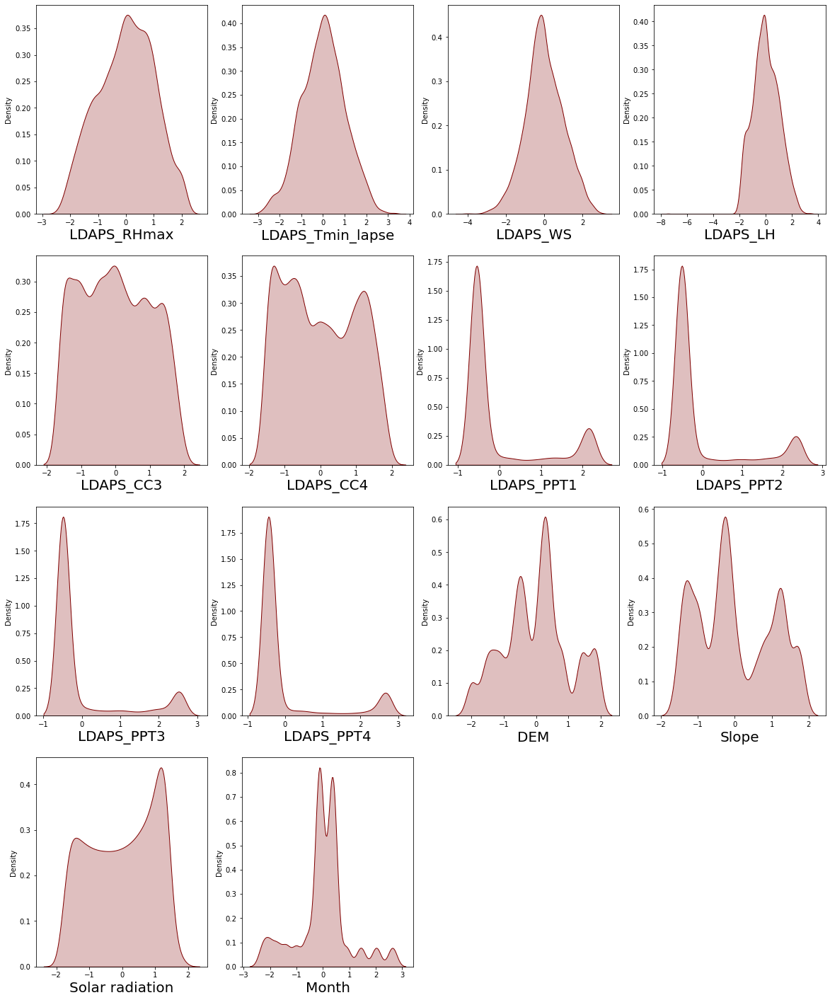

In [134]:
# After removing skewness let's check how the data has been distributed in each column.

plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in X[skew]:
    if plotnumber<=14:
        ax = plt.subplot(4,4,plotnumber)
        sns.distplot(X[column],color='maroon',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

After removing the skewness the data looks almost normal compared to old data. The skewness has been removed in all the columns and the skewness is reduced in the columns LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3 and LDAPS_PPT4.

Since the precipitation columns have skewness and are not in normal, so we will use MinMaxScaler to scale the data.

## Feature Scaling using MinMaxScaler

In [135]:
from sklearn.preprocessing import MinMaxScaler

mms=MinMaxScaler()
X = pd.DataFrame(mms.fit_transform(X), columns=X.columns)
X

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Day,Month,Year
0,0.750000,0.732955,0.838710,0.641402,0.720436,0.636771,0.748082,0.688166,0.630561,0.444690,0.568307,0.437622,0.430972,0.814963,0.074580,0.000000,0.000000,0.643008,0.362460,0.709380,0.739267,0.405070,0.651163,0.041667,0.537778,0.00
1,0.666667,0.721591,0.553763,0.365762,0.369639,0.799050,0.590396,0.709294,0.883513,0.423006,0.309345,0.514106,0.701802,0.215582,0.000000,0.000000,0.846680,0.857521,0.883495,0.596941,0.435057,0.506015,0.772093,0.041667,0.000000,0.25
2,1.000000,0.539773,0.698925,0.362152,0.370722,0.844451,0.617920,0.517247,0.684509,0.597467,0.402108,0.631593,0.858987,0.000000,0.000000,0.980015,0.966165,0.357521,0.466019,0.207329,0.168421,0.812976,0.762791,0.000000,0.537778,0.25
3,0.083333,0.505682,0.623656,0.279782,0.353837,0.670421,0.480518,0.666990,0.592774,0.158682,0.143509,0.391501,0.250222,0.593952,0.000000,0.028109,0.000000,0.643008,0.750809,0.424219,0.164035,0.759955,0.683721,0.250000,0.437757,0.75
4,0.250000,0.681818,0.854839,0.539058,0.423143,0.574820,0.632353,0.390065,0.839325,0.364113,0.431059,0.434192,0.131120,0.000000,0.000000,0.000000,0.000000,0.643008,0.038835,0.000000,0.000029,0.117498,0.734884,0.666667,0.537778,0.75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,0.583333,0.755682,0.779570,0.212883,0.142415,0.947240,0.844964,0.587766,0.577854,0.015988,0.022861,0.007895,0.130503,0.000000,0.000000,0.000000,0.000000,0.500530,0.359223,0.384076,0.502515,0.456651,0.883721,0.041667,0.180410,1.00
7748,0.500000,0.494318,0.575269,0.304513,0.633956,0.714635,0.426767,0.563378,0.713142,0.771869,0.164759,0.407731,0.273982,0.992595,0.000000,0.000000,0.000000,0.643008,0.831715,0.635190,0.857810,0.855370,0.716279,0.000000,0.110595,1.00
7749,0.541667,0.545455,0.602151,0.542299,0.465738,0.456369,0.458793,0.363185,0.505842,0.336563,0.614020,0.810054,0.818545,0.000000,0.001837,0.000000,0.000000,0.214513,0.326861,0.395945,0.396343,0.311278,0.451163,0.041667,1.000000,0.25
7750,0.041667,0.295455,0.586022,0.893743,0.806375,0.403865,0.513752,0.755502,0.635050,0.945568,0.841526,0.955258,0.857296,0.999985,0.967456,0.998672,0.000000,0.786017,0.666667,0.534308,0.339168,0.776056,0.381395,0.250000,0.437757,0.00


We have scaled the data using MinMaxScalar method to overcome with the issue of data biasness.

As we have observed in the heat map there is multicollinearity issue exists in the data, So let's check the VIF value and if the columns have VIF greater than 10 then we can drop those columns.

## Checking VIF values

In [136]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.598736,station
1,35.154944,Present_Tmax
2,78.080026,Present_Tmin
3,45.986393,LDAPS_RHmin
4,18.751391,LDAPS_RHmax
5,120.720769,LDAPS_Tmax_lapse
6,53.866132,LDAPS_Tmin_lapse
7,20.862029,LDAPS_WS
8,65.951881,LDAPS_LH
9,15.227578,LDAPS_CC1


The column LDAPS_Tmax_lapse has high VIF value compared to other features, we will remove this column to overcome with the issue of multicollinearity. After dropping the column will check VIF again, if we find the value above 10 then we will remove that column having high VIF. This process will continue until we get the VIF value less than 10.

In [137]:
# Dropping LDAPS_Tmax_lapse column
X.drop("LDAPS_Tmax_lapse",axis=1,inplace=True)

In [138]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.586394,station
1,34.024946,Present_Tmax
2,76.651387,Present_Tmin
3,33.305067,LDAPS_RHmin
4,18.645064,LDAPS_RHmax
5,35.936726,LDAPS_Tmin_lapse
6,20.603654,LDAPS_WS
7,60.166410,LDAPS_LH
8,15.194305,LDAPS_CC1
9,17.548304,LDAPS_CC2


The column Present_Tmin has high VIF value compared ot other columns. Let's drop this column.

In [139]:
# Dropping Present_Tmin column
X.drop("Present_Tmin",axis=1,inplace=True)

In [140]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.577625,station
1,30.287860,Present_Tmax
2,33.197151,LDAPS_RHmin
3,18.271454,LDAPS_RHmax
4,29.265115,LDAPS_Tmin_lapse
5,19.912521,LDAPS_WS
6,59.373762,LDAPS_LH
7,14.917525,LDAPS_CC1
8,17.546022,LDAPS_CC2
9,17.732365,LDAPS_CC3


In [141]:
# Dropping the column LDAPS_LH which has high VIF compared to other columns.
X.drop("LDAPS_LH",axis=1,inplace=True)

In [142]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.574447,station
1,26.816344,Present_Tmax
2,32.422043,LDAPS_RHmin
3,16.202651,LDAPS_RHmax
4,25.399371,LDAPS_Tmin_lapse
5,18.049203,LDAPS_WS
6,14.507811,LDAPS_CC1
7,17.170673,LDAPS_CC2
8,17.679300,LDAPS_CC3
9,9.675928,LDAPS_CC4


In [143]:
# Dropping Next_Tmax column as it contains high VIF compared to others.
X.drop("Next_Tmax",axis=1,inplace=True)

In [144]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.357750,station
1,22.420439,Present_Tmax
2,31.898138,LDAPS_RHmin
3,15.012202,LDAPS_RHmax
4,19.565807,LDAPS_Tmin_lapse
5,17.942441,LDAPS_WS
6,14.506970,LDAPS_CC1
7,16.963098,LDAPS_CC2
8,17.584827,LDAPS_CC3
9,9.659758,LDAPS_CC4


Still the VIF value is above 10 in many columns. Let's drop the column having high VIF value amongst them.


In [145]:
# Dropping LDAPS_RHmin column
X.drop("LDAPS_RHmin",axis=1,inplace=True)

In [146]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.353489,station
1,21.959436,Present_Tmax
2,10.499716,LDAPS_RHmax
3,17.943621,LDAPS_Tmin_lapse
4,17.494162,LDAPS_WS
5,14.424490,LDAPS_CC1
6,15.972219,LDAPS_CC2
7,15.747872,LDAPS_CC3
8,9.644795,LDAPS_CC4
9,3.300489,LDAPS_PPT1


In [147]:
# Droppoing Present_Tmax column as it has high VIF values
X.drop("Present_Tmax",axis=1,inplace=True)

In [148]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,4.249027,station
1,10.494177,LDAPS_RHmax
2,8.455902,LDAPS_Tmin_lapse
3,16.864879,LDAPS_WS
4,13.559921,LDAPS_CC1
5,15.963881,LDAPS_CC2
6,15.656609,LDAPS_CC3
7,9.638630,LDAPS_CC4
8,3.270818,LDAPS_PPT1
9,2.956593,LDAPS_PPT2


In [149]:
# Dropping LDAPS_WS column
X.drop("LDAPS_WS",axis=1,inplace=True)

In [150]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,3.968764,station
1,10.436610,LDAPS_RHmax
2,7.862778,LDAPS_Tmin_lapse
3,13.491842,LDAPS_CC1
4,15.963879,LDAPS_CC2
5,15.636448,LDAPS_CC3
6,9.616443,LDAPS_CC4
7,3.269027,LDAPS_PPT1
8,2.955624,LDAPS_PPT2
9,2.200587,LDAPS_PPT3


In [151]:
# Dropping LDAPS_CC2 column as it contains high VIF values compared to others
X.drop("LDAPS_CC2",axis=1,inplace=True)

In [152]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,3.968088,station
1,10.275046,LDAPS_RHmax
2,7.779405,LDAPS_Tmin_lapse
3,9.312590,LDAPS_CC1
4,12.846864,LDAPS_CC3
5,9.616340,LDAPS_CC4
6,3.072742,LDAPS_PPT1
7,2.322113,LDAPS_PPT2
8,2.199760,LDAPS_PPT3
9,2.027317,LDAPS_PPT4


In [153]:
# Removing DEM column
X.drop("DEM",axis=1,inplace=True)

In [174]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,3.680109,station
1,10.128386,LDAPS_RHmax
2,7.716922,LDAPS_Tmin_lapse
3,9.311825,LDAPS_CC1
4,12.843669,LDAPS_CC3
5,9.614301,LDAPS_CC4
6,3.068458,LDAPS_PPT1
7,2.318813,LDAPS_PPT2
8,2.199743,LDAPS_PPT3
9,2.027274,LDAPS_PPT4


In [154]:
# Dropping LDAPS_CC3 column
X.drop("LDAPS_CC3",axis=1,inplace=True)

In [155]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,3.680031,station
1,10.128315,LDAPS_RHmax
2,7.687641,LDAPS_Tmin_lapse
3,8.363750,LDAPS_CC1
4,5.068478,LDAPS_CC4
5,2.973010,LDAPS_PPT1
6,2.303686,LDAPS_PPT2
7,1.977942,LDAPS_PPT3
8,2.015596,LDAPS_PPT4
9,4.878332,lat


Still the column LDAPS_RHmax has VIF above 10 let's remove that column.

In [156]:
# Dropping LDAPS_RHmax column
X.drop("LDAPS_RHmax",axis=1,inplace=True)

In [157]:
# Checking varience inflation factor again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X.values,i)
              for i in range(len(X.columns))]
vif["Features"] = X.columns

# Let's check the values
vif

,VIF values,Features
0,3.680020,station
1,7.637569,LDAPS_Tmin_lapse
2,7.980586,LDAPS_CC1
3,5.057435,LDAPS_CC4
4,2.931576,LDAPS_PPT1
5,2.282662,LDAPS_PPT2
6,1.967399,LDAPS_PPT3
7,2.010568,LDAPS_PPT4
8,4.437019,lat
9,5.551137,lon


Finally we are getting the VIF value less than 10 in all the columns which means our data is free from multicollinearity problem.

In [158]:
# Checking dataframe after removing the columns
X.head()

,station,LDAPS_Tmin_lapse,LDAPS_CC1,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,Slope,Solar radiation,Day,Month,Year
0,0.750000,0.748082,0.444690,0.430972,0.814963,0.07458,0.000000,0.000000,0.643008,0.362460,0.739267,0.405070,0.041667,0.537778,0.00
1,0.666667,0.590396,0.423006,0.701802,0.215582,0.00000,0.000000,0.846680,0.857521,0.883495,0.435057,0.506015,0.041667,0.000000,0.25
2,1.000000,0.617920,0.597467,0.858987,0.000000,0.00000,0.980015,0.966165,0.357521,0.466019,0.168421,0.812976,0.000000,0.537778,0.25
3,0.083333,0.480518,0.158682,0.250222,0.593952,0.00000,0.028109,0.000000,0.643008,0.750809,0.164035,0.759955,0.250000,0.437757,0.75
4,0.250000,0.632353,0.364113,0.131120,0.000000,0.00000,0.000000,0.000000,0.643008,0.038835,0.000029,0.117498,0.666667,0.537778,0.75


In [159]:
X.shape

(7752, 15)

After removing the colums containing VIF above 10, the dataframe contains 15 columns. We have done all the preprocessing and data cleaning, now our dataset is ready for building the machine learning models.

# Modeling
## Finding best random state

In [160]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [161]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(X_train, Y_train)
    pred = mod.predict(X_test)
    acc=r2_score(Y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.8988199161488215  on Random_state  172


We have got the best random state and maximum R2 score.

## Creating new train test split

In [162]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=.30,random_state=maxRS)

# Regression Algorithms


In [164]:
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
import xgboost as xgb
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import metrics

## Random Forest Regressor

R2_Score: 0.8987782333985187
MAE: 0.6127596799928761
MSE: 0.6608042433994413
RMSE: 0.8128986673623234


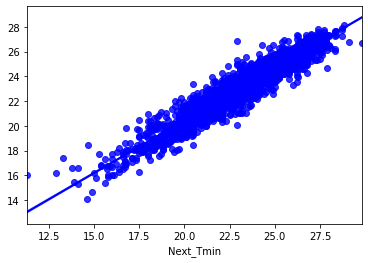

In [165]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(X_train,Y_train)

# prediction
predRFR=RFR.predict(X_test)
rf1=r2_score(Y_test,predRFR)
print('R2_Score:',rf1)
print('MAE:',metrics.mean_absolute_error(Y_test, predRFR))
print('MSE:',metrics.mean_squared_error(Y_test, predRFR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predRFR)))

# Visualizing the predicted values
sns.regplot(Y_test,predRFR,color="b")
plt.show()

We have created Random Forest Regressor and checked the evaluation metrics. The predicted R2 score for Random Forest Regressor is 89.87%.

## Decision Tree Regressor

R2_Score: 0.7708178427252836
MAE: 0.9132139122401335
MSE: 1.496165766744822
RMSE: 1.223178550639612


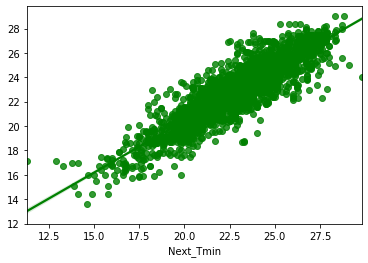

In [166]:
# Checking R2 score for Decision Tree Regressor
DTR=DecisionTreeRegressor()
DTR.fit(X_train,Y_train)

# prediction
predDTR=DTR.predict(X_test)
dt1=r2_score(Y_test,predDTR)
print('R2_Score:',dt1)
print('MAE:',metrics.mean_absolute_error(Y_test, predDTR))
print('MSE:',metrics.mean_squared_error(Y_test, predDTR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predDTR)))

# Visualizing the predicteed values
sns.regplot(Y_test,predDTR,color="g")
plt.show()

We have created Decision Tree Regressor and checked the evaluation metrics. The predicted R2 score for Decision Tree Regressor is 77.08%.

## GradientBoosting Regressor

R2_Score: 0.883693635145699
MAE: 0.6665496825883835
MSE: 0.7592807556172511
RMSE: 0.8713671761187995


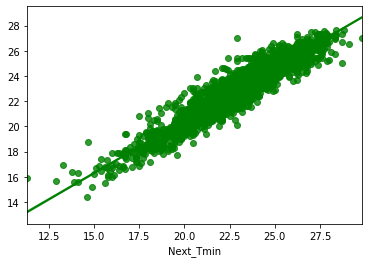

In [167]:
# Checking R2 score for GradientBoosting Regressor
GB=GradientBoostingRegressor()
GB.fit(X_train,Y_train)

# prediction
predGB=GB.predict(X_test)
gb2=r2_score(Y_test,predGB)
print('R2_Score:',gb2)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predGB))
print('MSE:',metrics.mean_squared_error(Y_test, predGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predGB)))

# Visualizing the predicted values
sns.regplot(Y_test,predGB,color="g")
plt.show()

We have created Gradient Boosting Regressor and checked the evaluation metrics. The predicted R2 score for Gradient Boosting Regressor is 88.36%.

## KNeighbors Regressor

R2_Score: 0.770321871220913
MAE: 0.919279740209869
MSE: 1.4994036086211027
RMSE: 1.2245013714247537


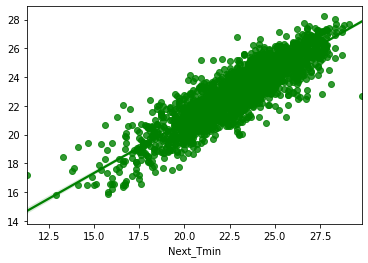

In [168]:
# Checking R2 score for KNeighbors Regressor
knn=KNN()
knn.fit(X_train,Y_train)

# prediction
predknn=knn.predict(X_test)
knr=r2_score(Y_test,predknn)
print('R2_Score:',knr)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predknn))
print('MSE:',metrics.mean_squared_error(Y_test, predknn))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predknn)))

# Visualizing the predicted values
sns.regplot(Y_test,predknn,color="g")
plt.show()

We have created KNN Regressor and checked the evaluation metrics. The predicted R2 score for KNN Regressor is 77.03%.

## Bagging Regressor

R2_Score: 0.8840584802757778
MAE: 0.6542519346517628
MSE: 0.7568989436983886
RMSE: 0.8699993929298966


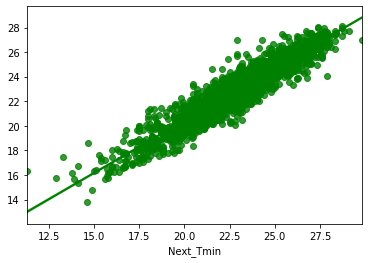

In [169]:
# Checking R2 score for BaggingRegressor

BR=BaggingRegressor()
BR.fit(X_train,Y_train)

# prediction
predBR=BR.predict(X_test)
br1=r2_score(Y_test,predBR)
print('R2_Score:',br1)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predBR))
print('MSE:',metrics.mean_squared_error(Y_test, predBR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predBR)))

# Visualizing the predicted values
sns.regplot(Y_test,predBR,color="g")
plt.show()

We have created Bagging Regressor and checked the evaluation metrics. The predicted R2 score for Bagging Regressor is 88.05%.

## XGB Regressor

R2_Score: 0.9307612931547189
MAE: 0.4945285846429851
MSE: 0.452009808038483
RMSE: 0.672316746807993


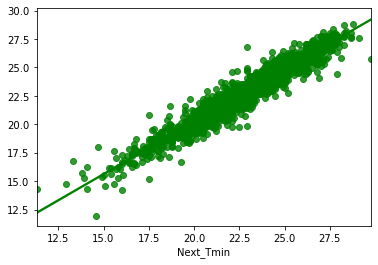

In [200]:
# Checking R2 score for XGB Regressor
from xgboost import XGBRegressor as xgb

XGB=xgb()
XGB.fit(X_train,Y_train)

# prediction
predXGB=XGB.predict(X_test)
xgb1=r2_score(Y_test,predXGB)
print('R2_Score:',xgb1)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predXGB))
print('MSE:',metrics.mean_squared_error(Y_test, predXGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predXGB)))

# Visualizing the predicted values
sns.regplot(Y_test,predXGB,color="g")
plt.show()

We have created XGB Regressor and checked the evaluation metrics. The predicted R2 score for XGB Regressor is 93.07%.

## Extra Trees Regressor

R2_Score: 0.9110657606722807
MAE: 0.5750462567792815
MSE: 0.5805877994861867
RMSE: 0.7619631221300587


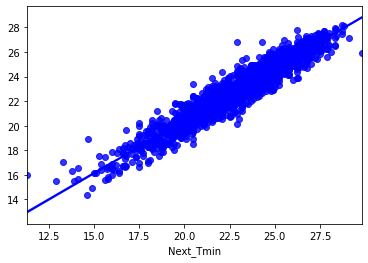

In [171]:
# Checking R2 score for Extra Trees Regressor

XT=ExtraTreesRegressor()
XT.fit(X_train,Y_train)

# prediction
predXT=XT.predict(X_test)
etr1=r2_score(Y_test,predXT)
print('R2_Score:',etr1)


# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predXT))
print('MSE:',metrics.mean_squared_error(Y_test, predXT))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predXT)))

# Visualizing the predicted values
sns.regplot(Y_test,predXT,color="b")
plt.show()

We have created Extra Trees Regressor and checked the evaluation metrics. The predicted R2 score for Extra Trees Regressor is 91.10%.

## Stochastic Gradient Descent Regressor

R2_Score: 0.7758151800041246
MAE: 0.9360095042784107
MSE: 1.463541739419182
RMSE: 1.2097692918152543


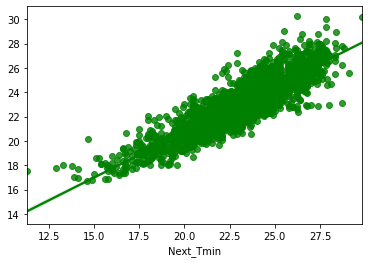

In [172]:
# Checking R2 score for SGD Regressor

SGD=SGDRegressor()
SGD.fit(X_train,Y_train)

# prediction
predSGD=SGD.predict(X_test)
sgd=r2_score(Y_test,predSGD)
print('R2_Score:',sgd)

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(Y_test, predSGD))
print('MSE:',metrics.mean_squared_error(Y_test, predSGD))
print("RMSE:",np.sqrt(metrics.mean_squared_error(Y_test, predSGD)))

# Visualizing the predicted values
sns.regplot(Y_test,predSGD,color="g")
plt.show()

We have created Extra Trees Regressor and checked the evaluation metrics. The predicted R2 score for Extra Trees Regressor is 77.58%.

## Checking the cross validation score

In [193]:
from sklearn.model_selection import cross_val_score

In [173]:
# Checking cv score for Random Forest Regressor
rfrcv=cross_val_score(RFR,X,Y,cv=5).mean()
print(rfrcv)

0.8905729598739514


In [174]:
# Checking cv score for Decision Tree Regressor
dtcv=cross_val_score(DTR,X,Y,cv=5).mean()
print(dtcv)

0.7642909543991012


In [175]:
# Checking cv score for Gradient Boosting Regressor
gbcv=cross_val_score(GB,X,Y,cv=5).mean()
print(gbcv)

0.8748738246167497


In [176]:
# Checking cv score for KNeighbors Regressor
kncv=cross_val_score(knn,X,Y,cv=5).mean()
print(kncv)

0.7791062004473321


In [177]:
# Checking cv score for Bagging Regressor
brcv=cross_val_score(BR,X,Y,cv=5).mean()
print(brcv)

0.8773282422313555


In [202]:
# Checking cv score for XGBRegressor
xgbcv=cross_val_score(XGB,X,Y,cv=5).mean()
print(xgbcv)

0.9318391514426259


In [190]:
# Checking cv score for ExtraTreesRegressor
excv=cross_val_score(XT,X,Y,cv=5).mean()
print(excv)

0.9057982352626499


In [180]:
# Checking cv score for SGDRegressor
sdgcv=cross_val_score(SGD,X,Y,cv=5).mean()
print(sdgcv)

0.7659565416864405


In [191]:
model_list=['Random Forest Regressor','Decision Tree Regressor','Gradient Boosting Regressor','KNeighbors Regressor','Bagging Regressor','XGBRegressor','ExtraTreesRegressor','SGDRegressor']

In [192]:
accuracyscore1=[rf1,dt1,gb2,knr,br1,xgb1,etr1,sgd]

In [193]:
crossval1=[rfrcv,dtcv,gbcv,kncv,brcv,xgbcv,excv,sdgcv]

In [194]:
models1=pd.DataFrame({})
models1['Regressor']=model_list
models1['Accuracy_Score']=accuracyscore1
models1['crossval']=crossval1

In [195]:
models1

,Regressor,Accuracy_Score,crossval
0,Random Forest Regressor,0.898778,0.890573
1,Decision Tree Regressor,0.770818,0.764291
2,Gradient Boosting Regressor,0.883694,0.874874
3,KNeighbors Regressor,0.770322,0.779106
4,Bagging Regressor,0.884058,0.877328
5,XGBRegressor,0.930761,0.931839
6,ExtraTreesRegressor,0.911066,0.905798
7,SGDRegressor,0.775815,0.765957


Above are the cross validation score for the models that we have used.

From the differences between the R2 score and Cross Validation Score we can conclude that XGB Regressor as our best fitting model. We will perform Hyper parameter tuning on the best model.

## Hyper parameter tuning

In [181]:
from sklearn.model_selection import GridSearchCV

In [182]:
#XGB Regressor

parameters = {'n_estimators' : [50,100,200, 400],
              'gamma' : np.arange(0,0.5,0.1),
              'max_depth' : [4, 6, 8,10],
              'n_jobs' : [-2, -1, 1]}

These are the parameters of XGB Regressor.

In [183]:
GCV=GridSearchCV(xgb(),parameters,cv=5)

Running GridSearchCV for XGB Regressor.

In [184]:
GCV.fit(X_train,Y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, random_state=None,
                                    reg_alpha=None, reg_lambda=None,
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_para

In [185]:
GCV.best_params_

{'gamma': 0.1, 'max_depth': 6, 'n_estimators': 400, 'n_jobs': -2}

These are the best parameters values.

R2_Score: 93.14440846891436
RMSE value: 0.6689935368228821
MAE: 0.4895888896930749
MSE: 0.44755235231078894


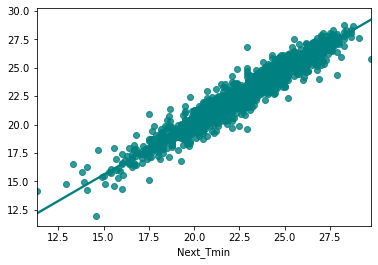

In [205]:
Final_model2 = xgb(gamma=0.0, max_depth=6, n_estimators=400, n_jobs=-2)
Final_model2.fit(X_train, Y_train)
pred = Final_model2.predict(X_test)
print('R2_Score:',r2_score(Y_test,pred)*100)
print("RMSE value:",np.sqrt(metrics.mean_squared_error(Y_test, pred)))
print('MAE:',metrics.mean_absolute_error(Y_test, pred))
print('MSE:',metrics.mean_squared_error(Y_test, pred))

# Visualizing the predicted values
sns.regplot(Y_test,pred,color="teal")
plt.show()

Great!!!...After hyper parameter tuning our best model accuracy increased and is giving 93.14% which is good.

## Saving the model

In [187]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_model2,"TemperatureForecastNextTmin.pkl")

['TemperatureForecastNextTmin.pkl']

We have saved the model using jiblib library.

## Predicting the saved model

In [188]:
# Loading the saved model
Model2=joblib.load("TemperatureForecastNextTmin.pkl")

#Prediction
prediction_Tmin = Model2.predict(X_test)
prediction_Tmin

array([25.765797, 27.001553, 23.87242 , ..., 25.873632, 21.299831,
       22.056799], dtype=float32)

Here we have loaded our saved model of predictioon for Next_Tmin and got the predicted next day minimum temperature values which are displayes above.

In [189]:
pd.DataFrame([Model2.predict(X_test)[:],Y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,25.765797,26.1
1,27.001553,26.8
2,23.872419,24.0
3,25.487141,26.2
4,26.473408,26.2
...,...,...
2321,22.861605,23.5
2322,24.005831,23.8
2323,25.873632,26.5
2324,21.299831,21.7


We have created a DataFrame of Actual and Predicted temperature values . Here Actual Next_Tmin and predicted Next_Tmin temperature values are almost same.

## Conclusion:

- The final R2 score for the prediction of Next_Tmax using Regression algorithms is = 93.09%.
- The final R2 score for the prediction of Next_Tmin using Regression algorithms is = 93.47%.